# Liver analysis 002

**Date**: 2020-11-23<br>
**Author**: Alma Andersson<br>
**Description**:<br>

Joint spatial analysis of the entire dataset. The analysis is separated into three parts

- Data Loading and processing
- Feature by distance analysis
- Classification of structures

### Data loading and processing
A brief section loading and processing the data.


### Feature by distance analysis
Here, expression as a function of distance (_feature by distance_) is exemplified, as well as the slightly modified variant where the log-ratio between distances to two different structure classes (here portal and central veins) is examined.


### Classification
This section illustrates how the type of a vein can be predicted based on its neighborhood expression profile (NEP). Included in the analysis is the creation of NEPs, a two step procedure where a neighborhood is first identified, from which a weighted gene expression (by distance) is then assembled. Once the NEPs are formed, a _logistic regression_ model is trained to predict vein type based on the NEP. Cross validation is also implemented to assess performance.


<hr>

### Load libraries

Load data the necessary packages and data for the analysis, also specify certain constants which will be used throughout the analysis.

In [1]:
%load_ext autoreload
%autoreload 2


In [2]:
import pandas as pd
import numpy as np
import anndata as ad

from skmisc.loess import loess

import os
import os.path as osp
from os import listdir

import matplotlib.pyplot as plt

from PIL import Image

from functools import reduce

from scipy.spatial.distance import cdist

import utils as ut

import re
import datetime


### Global Variables

Here certain global variables are set, which will be used to save output and load data. A brief explanation is provided below:

- TAG : Unique identifier for the analysis. All results will be saved in a folder called "TAG-analysis" within the res-folder.
- REPO\_DIR : Path to the repository directory, only change this if files are moved around.
- DATA_DIR : Path to the data being loaded.
- GENE_LIST_DIR : Directory to lists of genes
- SCALE_FACTOR : Scaling factor between pixels to $\mu m$

In [3]:

TAG = re.sub(":| |-|\\.|","",str(datetime.datetime.today()))
TAG = TAG + "-analysis"

REPO_DIR = osp.dirname(osp.abspath(os.getcwd()))
DATA_DIR = osp.join(REPO_DIR,"data/h5ad-cca")
RESULTS_DIR = osp.join(REPO_DIR,"res",TAG)

if not osp.exists(RESULTS_DIR):
    os.mkdir(RESULTS_DIR)
    
GENE_LIST_DIR = osp.join(REPO_DIR,"data/gene-lists/")


SCALE_FACTOR = 0.26

SAVE_RESULTS = True

In [5]:
# Get data paths
PTHS = list(filter(lambda x: x.endswith("h5ad"),os.listdir(DATA_DIR)))
PTHS = {p:osp.join(DATA_DIR,p) for p in PTHS }

data_set = {n:ad.read_h5ad(p) for n,p in PTHS.items()}
new_names = {k:d.uns["sample"] + "-" + d.uns["replicate"] for k,d in data_set.items()}
data_set = dict((new_names[k],d) for k,d in data_set.items())
    
data_set

{'CN65-C1': AnnData object with n_obs × n_vars = 647 × 9655
     obs: '_x', '_y', 'x', 'y', 'sample', 'replicate'
     var: 'gene'
     uns: 'img', 'mask', 'replicate', 'sample'
     obsm: 'vein_distances',
 'CN73-D1': AnnData object with n_obs × n_vars = 684 × 9655
     obs: '_x', '_y', 'x', 'y', 'sample', 'replicate'
     var: 'gene'
     uns: 'img', 'mask', 'replicate', 'sample'
     obsm: 'vein_distances',
 'CN65-C2': AnnData object with n_obs × n_vars = 626 × 9655
     obs: '_x', '_y', 'x', 'y', 'sample', 'replicate'
     var: 'gene'
     uns: 'img', 'mask', 'replicate', 'sample'
     obsm: 'vein_distances',
 'CN16-E1': AnnData object with n_obs × n_vars = 1348 × 9655
     obs: '_x', '_y', 'x', 'y', 'sample', 'replicate'
     var: 'gene'
     uns: 'img', 'mask', 'replicate', 'sample'
     obsm: 'vein_distances',
 'CN73-C1': AnnData object with n_obs × n_vars = 673 × 9655
     obs: '_x', '_y', 'x', 'y', 'sample', 'replicate'
     var: 'gene'
     uns: 'img', 'mask', 'replicate', 's

In [6]:
exclude = ["CN65-E1","CN65-C1","CN65-C2","CN65-D2","CN16-D1"]

for ex in exclude:
    data_set.pop(ex)

data_set

{'CN73-D1': AnnData object with n_obs × n_vars = 684 × 9655
     obs: '_x', '_y', 'x', 'y', 'sample', 'replicate'
     var: 'gene'
     uns: 'img', 'mask', 'replicate', 'sample'
     obsm: 'vein_distances',
 'CN16-E1': AnnData object with n_obs × n_vars = 1348 × 9655
     obs: '_x', '_y', 'x', 'y', 'sample', 'replicate'
     var: 'gene'
     uns: 'img', 'mask', 'replicate', 'sample'
     obsm: 'vein_distances',
 'CN73-C1': AnnData object with n_obs × n_vars = 673 × 9655
     obs: '_x', '_y', 'x', 'y', 'sample', 'replicate'
     var: 'gene'
     uns: 'img', 'mask', 'replicate', 'sample'
     obsm: 'vein_distances',
 'CN65-D1': AnnData object with n_obs × n_vars = 663 × 9655
     obs: '_x', '_y', 'x', 'y', 'sample', 'replicate'
     var: 'gene'
     uns: 'img', 'mask', 'replicate', 'sample'
     obsm: 'vein_distances',
 'CN16-D2': AnnData object with n_obs × n_vars = 487 × 9655
     obs: '_x', '_y', 'x', 'y', 'sample', 'replicate'
     var: 'gene'
     uns: 'img', 'mask', 'replicate', 's

In [8]:
use_short_filter = True

pths = listdir(osp.join(GENE_LIST_DIR,"veins"))
if use_short_filter:
    pths = list(filter(lambda x: "short" in x,pths))
else:
    pths = list(filter(lambda x: "short" not in x,pths))
# read gene lists
genes = dict()

for filename in pths:
    name = '.'.join(filename.split(".")[0:-1])
    with open(osp.join(GENE_LIST_DIR,"veins",filename),"r+") as f:
        _gs = f.readlines()
        _gs = [x.replace("\n","") for x in _gs]
        genes.update({name:_gs})
        
# create an additional entry called "all" by joining 
# all existing lists
genes["all"] = reduce(lambda x,y : x + y,list(genes.values()))

Visualize the data to make sure everything looks as expected

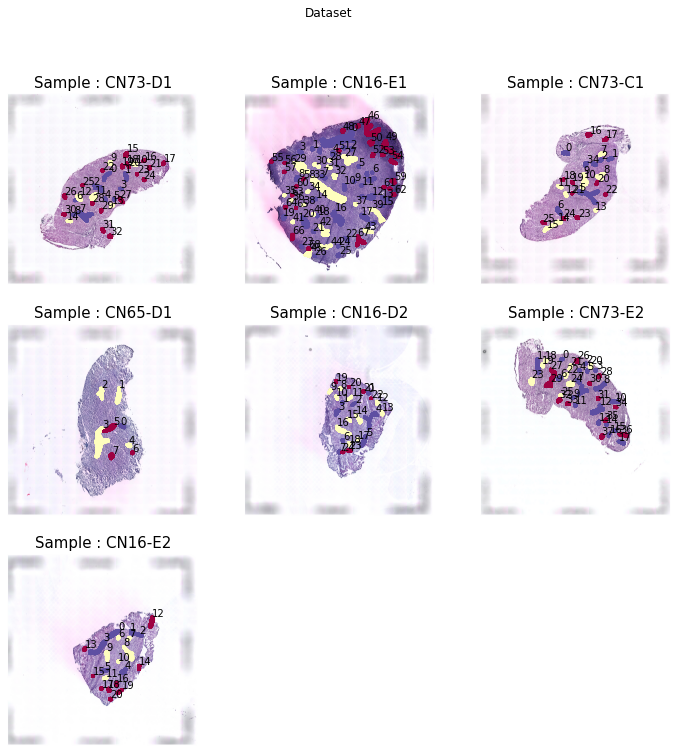

In [9]:
n_veins = len(data_set)
spot_size = 20
side_size =4

fig,ax = ut.get_figure(n_veins,n_cols = 3, side_size = side_size)

for k,(sample_id,data) in enumerate(data_set.items()):
    
    ut.plot_veins(ax[k],data,
                  show_image=True,
                  show_id=True)
    
    ax[k].set_title("Sample : {}".format(sample_id),
                   fontsize = 15,
                   )
    
fig.suptitle("Dataset")
if SAVE_RESULTS:
    fig.savefig(osp.join(RESULTS_DIR,"dataset-display.png"))
plt.show()

In [11]:
for sample,data in data_set.items():
    log_ratio = np.log(data.obsm["vein_distances"].dist_type_central) -\
    np.log(data.obsm["vein_distances"].dist_type_portal)
    data_set[sample].obsm["vein_distances"]["log(central/portal)"] = log_ratio

## Analysis : Expression by distance

Model gene expression as a function of the distance to the nearest gene. We use loess regression to get an approximation of the curve that describe the trends in the data. Envelopes (blue) represent 1 standard error.

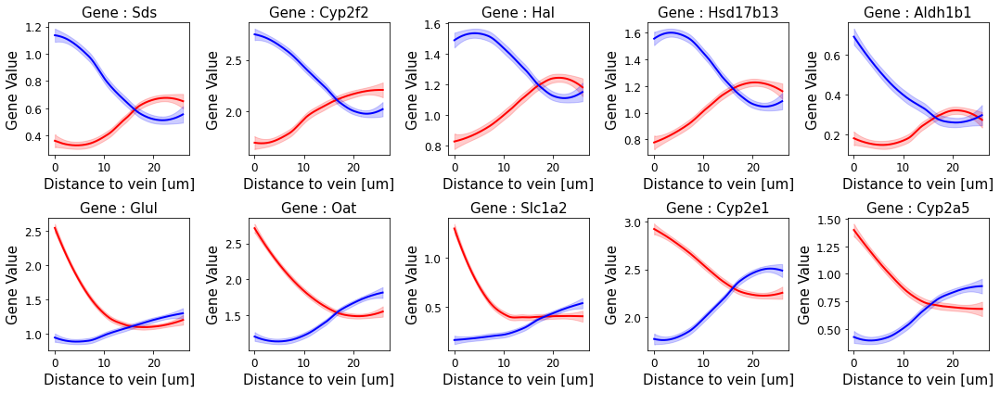

In [12]:

# set vein type to plot
vein_type = "all"

# set to true if plots should share y-axis
share_y = False

# set within which distance from the vein
# gene expresssion should be assessed; could
# be same as RADIUS
dist_thrs = 100

# which genes to be assessed
vein_genes = genes[vein_type]

# distance values to use

colormap = dict(central = {"envelope":"red",
                           "fitted":"red",
                           "background":"red"},
               portal = {"envelope":"blue",
                         "fitted":"blue",
                         "background":"blue"},
               )

fig,ax = ut.get_figure(len(vein_genes),
                       n_cols = 5,
                       side_size = 3,
                      )

# iterate over each gene
for k,gene in enumerate(vein_genes):
    
    
    for vt in ["central","portal"]:

        xs = np.array([])
        ys = np.array([])

        for data in data_set.values():
            if gene not in data.var.gene.values:
                print("can't find {}".format(gene))
                continue

            min_dist = data.obsm["vein_distances"]["dist_type_" + vt].values
            xs = np.append(xs,min_dist)
            ys = np.append(ys,data.obs_vector(gene))
        
        smoothed = ut.smooth_fit(xs,ys,dist_thrs=dist_thrs)
        ut.plot_expression_by_distance(ax[k],
                                       data = smoothed,
                                       curve_label = vt,
                                       color_scheme = colormap[vt],
                                       include_background = False,
                                       feature_type = "Gene",
                                       feature = gene,
                                       distance_scale_factor = SCALE_FACTOR,
                                       title_fontsize = 18,
                                       label_fontsize = 15,
                                       tick_fontsize = 12,
                                       distance_unit = "um",
                                      )


fig.tight_layout()

if SAVE_RESULTS:
    fig.savefig(osp.join(RESULTS_DIR,"feature-by-distance.png"),
                facecolor = "white")
    
plt.show()

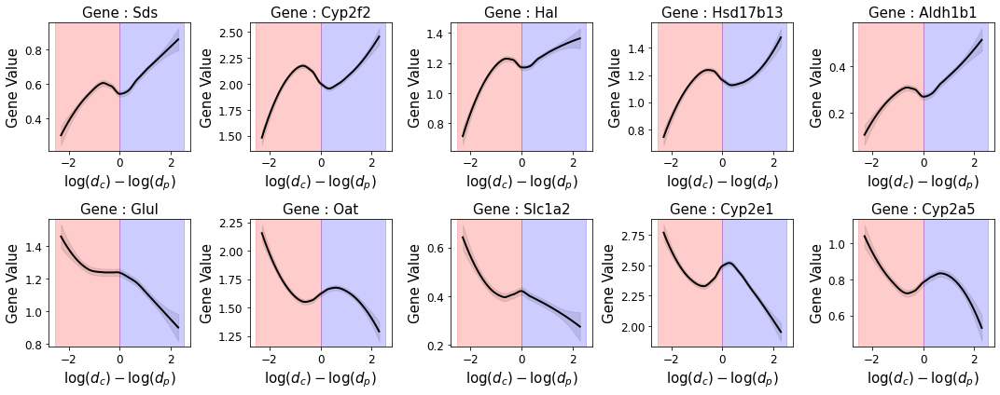

In [14]:

# set vein type to plot
vein_type = "all"

# set to true if plots should share y-axis
share_y = False

# set within which distance from the vein
# gene expresssion should be assessed; could
# be same as RADIUS
dist_thrs = np.log(10)

# which genes to be assessed
vein_genes = genes[vein_type]


fig,ax = ut.get_figure(n_elements=len(vein_genes),
                       n_cols = 5,
                       side_size = 3,
                      )
# --- plot settings

# iterate over each gene
#for k,gene in enumerate(vein_genes):
for k,gene in enumerate(vein_genes):

    xs = np.array([])
    ys = np.array([])

    for data in data_set.values():
        if gene not in data.var.gene.values:
            continue

        dist = data.obsm["vein_distances"]["log(central/portal)"].values
        xs = np.append(xs,dist)
        ys = np.append(ys,data.obs_vector(gene))

    smoothed = ut.smooth_fit(xs,ys,dist_thrs=dist_thrs)
    ut.plot_expression_by_distance(ax[k],
                                   smoothed,
                                   flavor ="logodds",
                                   feature = gene,
                                   color_scheme = {"envelope":"gray"},
                                   include_background = False,
                                   feature_type = "Gene",
                                   title_fontsize = 18,
                                   label_fontsize = 15,
                                   tick_fontsize = 12,
                                  )

fig.tight_layout()
if SAVE_RESULTS:
    fig.savefig(osp.join(RESULTS_DIR,"feature-by-distance-ratio.png"),
                facecolor = "white")
plt.show()

## Analysis : Classification

Begin by assembling representative (mean expression) vectors for neighborhoods around respective vein type and each individual vein. Then proceed to train a predictor (Logistic Regression) and see how it performs on the given data (this is just a prototype).

### Prepare data
Create the necessary mean expression profiles

In [15]:
import utils as ut
vein_data = ut.VeinData(data_set = data_set,
                        radius = 80,
                        use_genes = genes["all"],
                        weight_by_distance = True,
                        sigma = 20,
                        verbose = True,
                       )

model = ut.Model(vein_data,
                 verbose=False)


Sample : CN73-D1 | Vein 0 | Spots used : 18
Sample : CN73-D1 | Vein 1 | Spots used : 16
Sample : CN73-D1 | Vein 2 | Spots used : 21
Sample : CN73-D1 | Vein 3 | Spots used : 9
Sample : CN73-D1 | Vein 4 | Spots used : 12
Sample : CN73-D1 | Vein 5 | Spots used : 11
Sample : CN73-D1 | Vein 6 | Spots used : 9
Sample : CN73-D1 | Vein 7 | Spots used : 30
Sample : CN73-D1 | Vein 8 | Spots used : 10
Sample : CN73-D1 | Vein 9 | Spots used : 10
Sample : CN73-D1 | Vein 10 | Spots used : 16
Sample : CN73-D1 | Vein 11 | Spots used : 17
Sample : CN73-D1 | Vein 12 | Spots used : 17
Sample : CN73-D1 | Vein 13 | Spots used : 11
Sample : CN73-D1 | Vein 14 | Spots used : 14
Sample : CN73-D1 | Vein 15 | Spots used : 11
Sample : CN73-D1 | Vein 16 | Spots used : 13
Sample : CN73-D1 | Vein 17 | Spots used : 11
Sample : CN73-D1 | Vein 18 | Spots used : 9
Sample : CN73-D1 | Vein 19 | Spots used : 11
Sample : CN73-D1 | Vein 20 | Spots used : 9
Sample : CN73-D1 | Vein 21 | Spots used : 9
Sample : CN73-D1 | Vein 2

Sample : CN73-E2 | Vein 31 | Spots used : 10
Sample : CN73-E2 | Vein 32 | Spots used : 14
Sample : CN73-E2 | Vein 33 | Spots used : 11
Sample : CN73-E2 | Vein 34 | Spots used : 11
Sample : CN73-E2 | Vein 35 | Spots used : 11
Sample : CN73-E2 | Vein 36 | Spots used : 16
Sample : CN73-E2 | Vein 37 | Spots used : 13
Sample : CN16-E2 | Vein 0 | Spots used : 21
Sample : CN16-E2 | Vein 1 | Spots used : 15
Sample : CN16-E2 | Vein 2 | Spots used : 12
Sample : CN16-E2 | Vein 3 | Spots used : 36
Sample : CN16-E2 | Vein 4 | Spots used : 17
Sample : CN16-E2 | Vein 5 | Spots used : 16
Sample : CN16-E2 | Vein 6 | Spots used : 11
Sample : CN16-E2 | Vein 7 | Spots used : 11
Sample : CN16-E2 | Vein 8 | Spots used : 27
Sample : CN16-E2 | Vein 9 | Spots used : 19
Sample : CN16-E2 | Vein 10 | Spots used : 9
Sample : CN16-E2 | Vein 11 | Spots used : 13
Sample : CN16-E2 | Vein 12 | Spots used : 18
Sample : CN16-E2 | Vein 13 | Spots used : 12
Sample : CN16-E2 | Vein 14 | Spots used : 12
Sample : CN16-E2 | Ve

### Train and Predict with classifier

use the `LogisticRegression` module from `sklearn` to create a classifier (binary classification into portal and central veins). We use a l2 penalty to reduce the extent of overfitting and also prevent the weights to blow up.

In [16]:
k = 1
exclude_class = "unknown"
validate_by = "sample"

results = model.cross_validation(k=k,
                                 exclude_class=exclude_class,
                                 by = validate_by,
                                 verbose = False,
                                 )
display(results)
print("Average Accuracy {}".format(results["accuracy"].mean()))

if SAVE_RESULTS:
    if isinstance(exclude_class,list):
        exclude_class = "_".join(exclude_class)
    
    basename = f'CV-{k}-EX-{exclude_class}-BY-{validate_by}.tsv'
    results.to_csv(osp.join(RESULTS_DIR,basename),
                   sep = "\t",
                
                  )


,pred_on,train_on,accuracy
0,CN16-E2,"CN73-D1, CN16-E1, CN73-C1, CN65-D1, CN16-D2, C...",1.000000
1,CN73-E2,"CN73-D1, CN16-E1, CN73-C1, CN65-D1, CN16-D2, C...",0.807692
2,CN16-D2,"CN73-D1, CN16-E1, CN73-C1, CN65-D1, CN73-E2, C...",0.947368
3,CN65-D1,"CN73-D1, CN16-E1, CN73-C1, CN16-D2, CN73-E2, C...",1.000000
4,CN73-C1,"CN73-D1, CN16-E1, CN65-D1, CN16-D2, CN73-E2, C...",0.937500
5,CN16-E1,"CN73-D1, CN73-C1, CN65-D1, CN16-D2, CN73-E2, C...",0.934783
6,CN73-D1,"CN16-E1, CN73-C1, CN65-D1, CN16-D2, CN73-E2, C...",0.933333


Average Accuracy 0.937239524396275


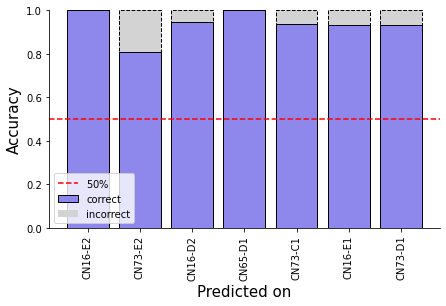

In [17]:
fig,ax = ut.visualize_prediction_result(results)

if SAVE_RESULTS:
    fig.savefig(osp.join(RESULTS_DIR,basename.replace("tsv","png")),
               facecolor = "white",
               )


Finally we can visualize the prediction on the tissue, showing the predicted and true labels for respective vein

In [18]:
k = 1
exclude_class = "unknown"
validate_by = "individual"

results = model.cross_validation(k=1,
                                 exclude_class="unknown",
                                 by = "individual",
                                 verbose = False,
                                 )
if SAVE_RESULTS:
    if isinstance(exclude_class,list):
        exclude_class = "_".join(exclude_class)
    
    basename = f'CV-{k}-EX-{exclude_class}-BY-{validate_by}.tsv'
    results.to_csv(osp.join(RESULTS_DIR,basename),
                   sep = "\t",
                  )

display(results)

,pred_on,train_on,accuracy
0,CN65,"CN73, CN16",1.000000
1,CN16,"CN73, CN65",0.948052
2,CN73,"CN16, CN65",0.877193


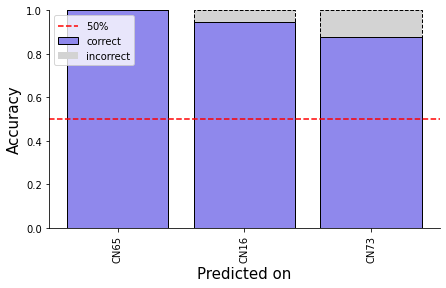

In [19]:
fig,ax = ut.visualize_prediction_result(results)
if SAVE_RESULTS:
    fig.savefig(osp.join(RESULTS_DIR,basename.replace("tsv","png")),
               facecolor = "white",
               )

## Prediction on unknown veins

In [20]:
model.fit(train_on = "all",
          verbose=True,
          exclude_class="unknown")

predict = model.predict(predict_on="all",
                        exclude_class=["portal","central"],
                        return_probs = True,
                       )


[INFO] : Training on samples: all
[INFO] : Accuracy on training data is >> 92.086%


Vein : CN73-D1_15 | P(central) : 0.9677464931294105 | P(portal) : 0.0322535068705895


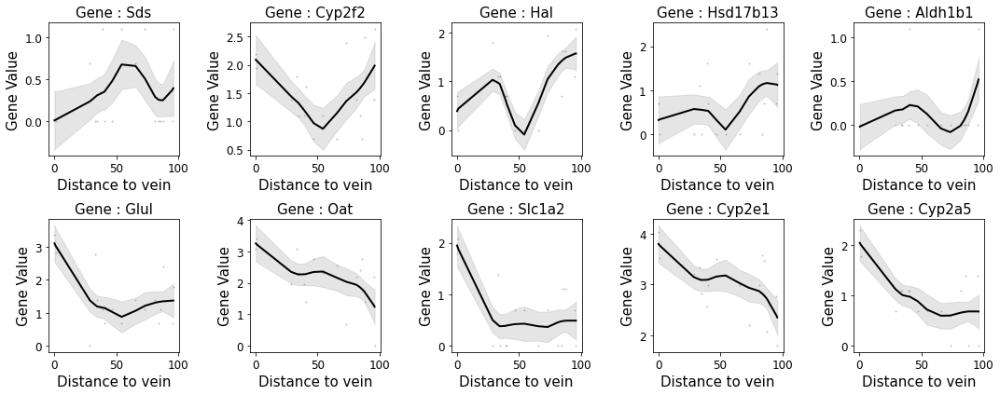

Vein : CN73-D1_16 | P(central) : 0.3270058745463321 | P(portal) : 0.6729941254536679


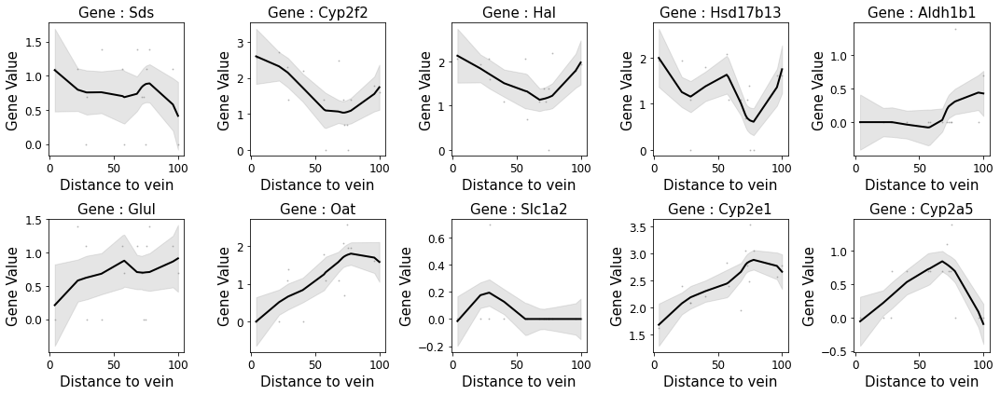

Vein : CN73-D1_17 | P(central) : 0.27110961699209113 | P(portal) : 0.7288903830079089


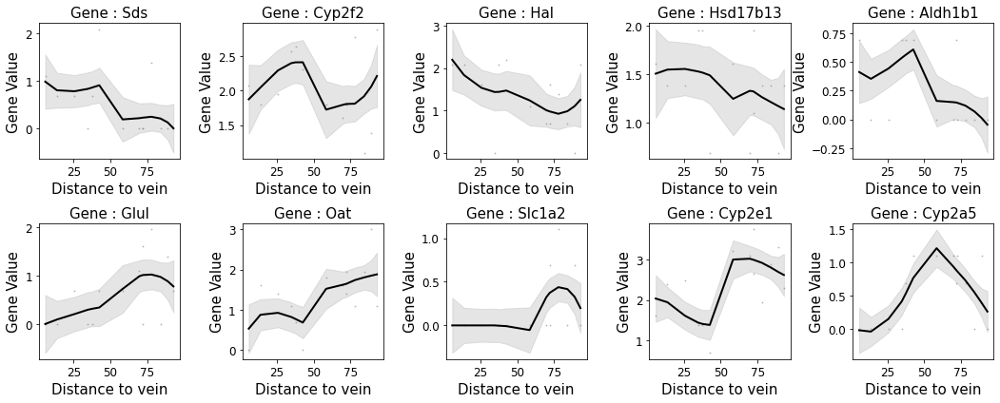

Vein : CN73-D1_18 | P(central) : 0.4367842976900753 | P(portal) : 0.5632157023099247


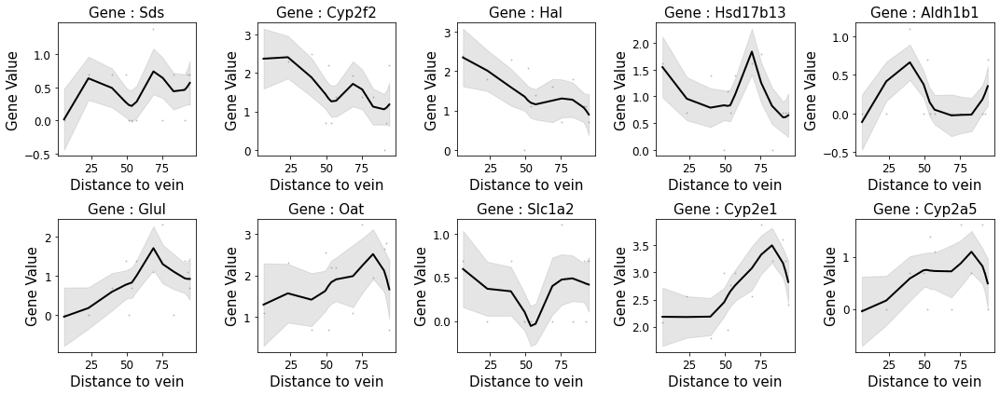

Vein : CN73-D1_19 | P(central) : 0.8600033746539415 | P(portal) : 0.13999662534605847


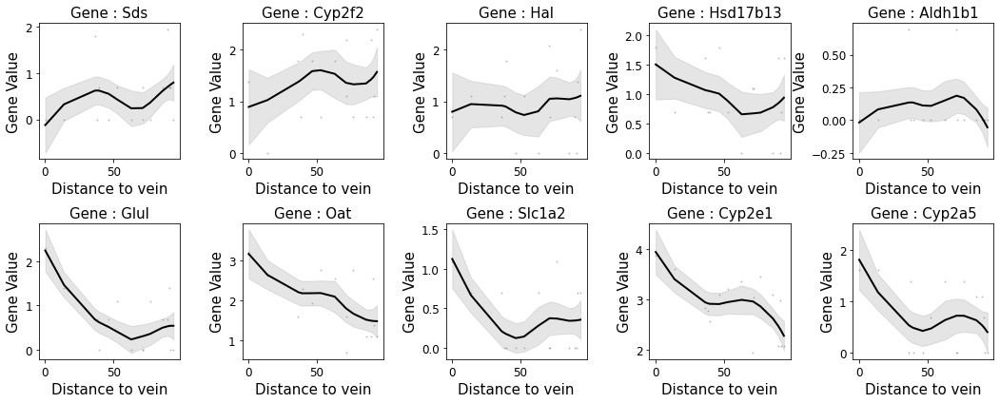

Vein : CN73-D1_20 | P(central) : 0.35974414919626785 | P(portal) : 0.6402558508037322


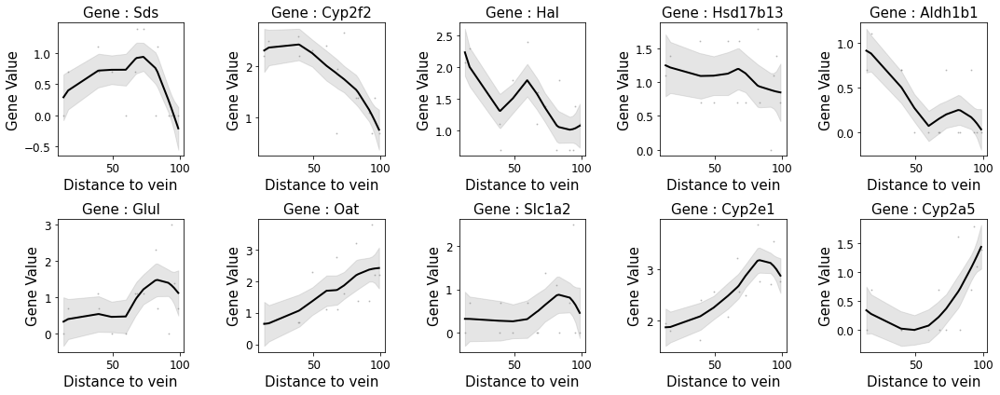

Vein : CN73-D1_21 | P(central) : 0.9157992903600125 | P(portal) : 0.08420070963998744


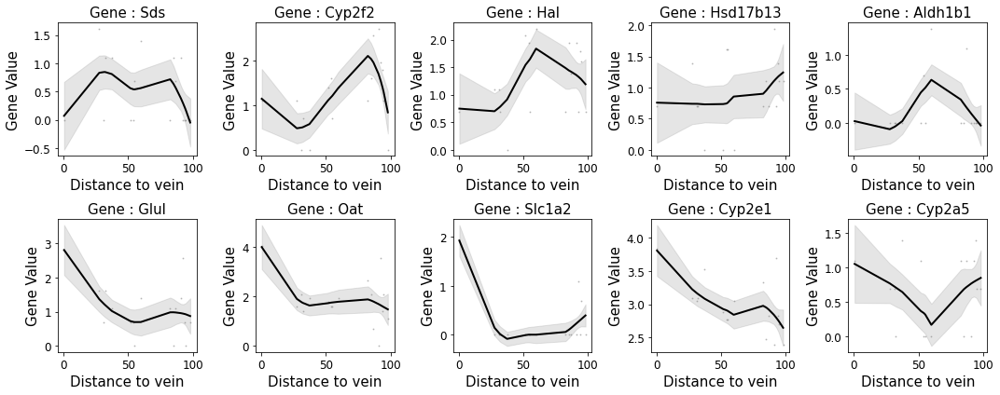

Vein : CN73-D1_22 | P(central) : 0.8736598112963444 | P(portal) : 0.12634018870365557


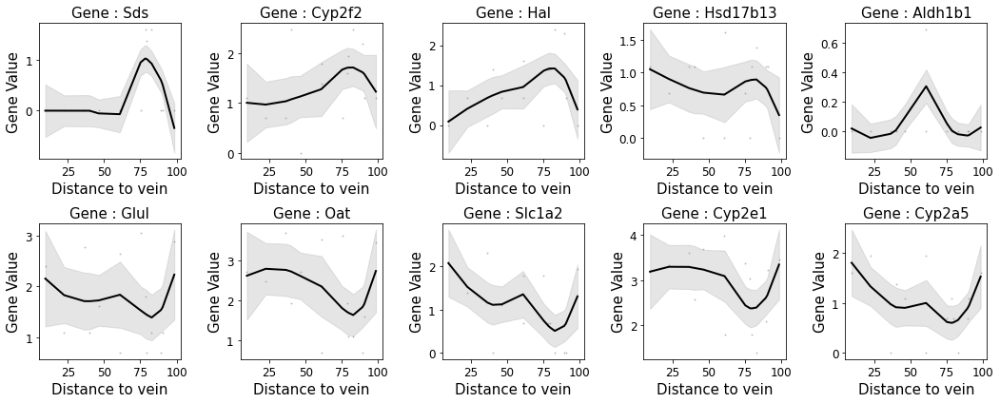

Vein : CN73-D1_23 | P(central) : 0.356816244984972 | P(portal) : 0.643183755015028


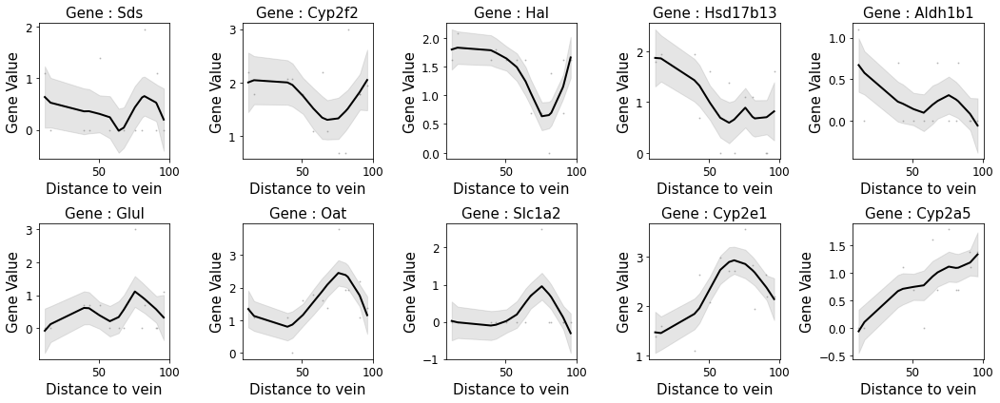

Vein : CN73-D1_24 | P(central) : 0.8175508438527547 | P(portal) : 0.18244915614724533


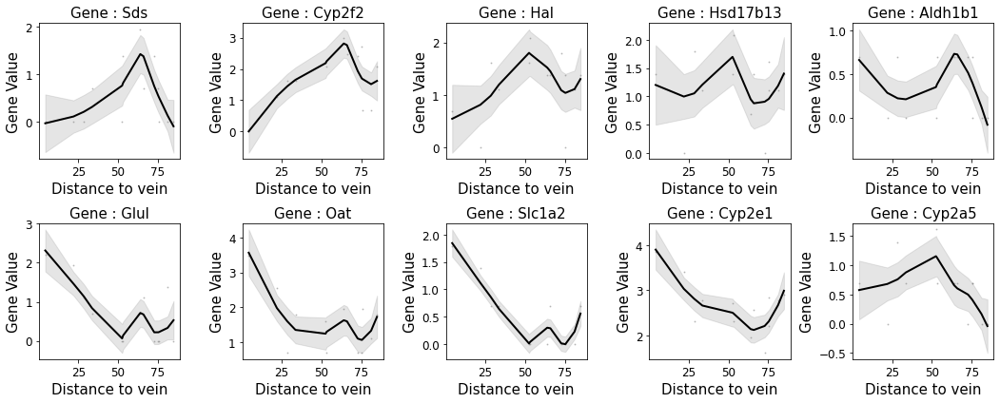

Vein : CN73-D1_25 | P(central) : 0.9065461019923626 | P(portal) : 0.0934538980076374


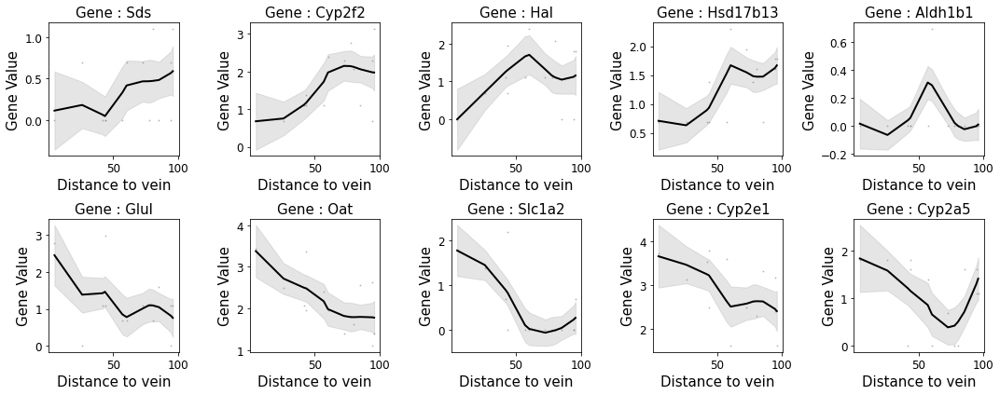

Vein : CN73-D1_26 | P(central) : 0.9640376377664356 | P(portal) : 0.035962362233564464


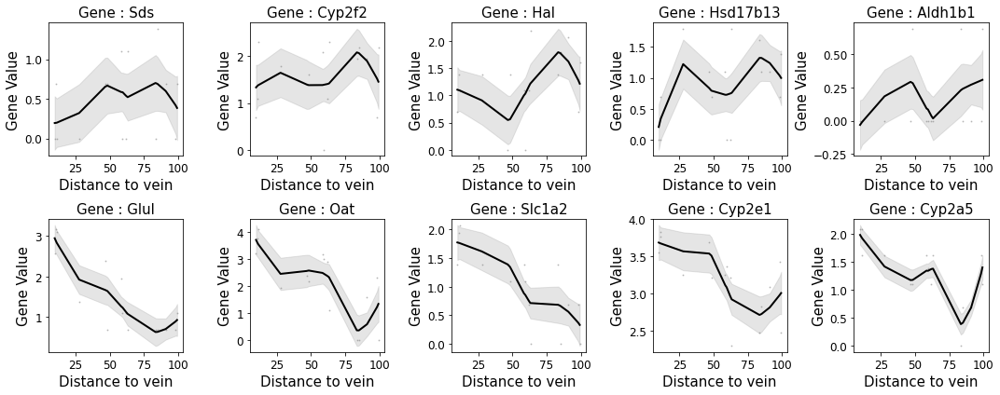

Vein : CN73-D1_27 | P(central) : 0.3274199989315624 | P(portal) : 0.6725800010684376


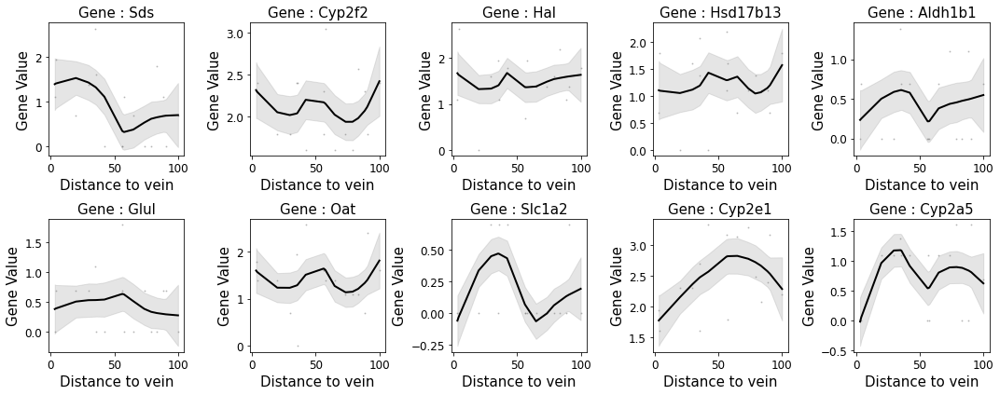

Vein : CN73-D1_28 | P(central) : 0.48034265850721847 | P(portal) : 0.5196573414927815


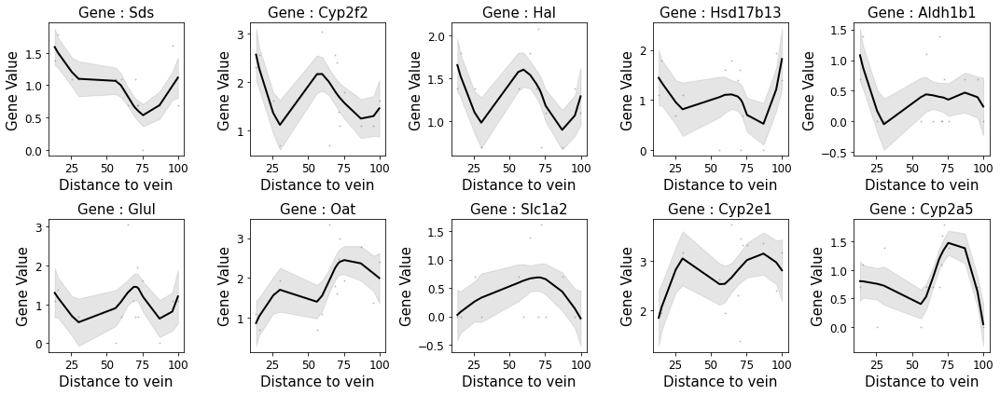

Vein : CN73-D1_29 | P(central) : 0.4153843070165606 | P(portal) : 0.5846156929834394


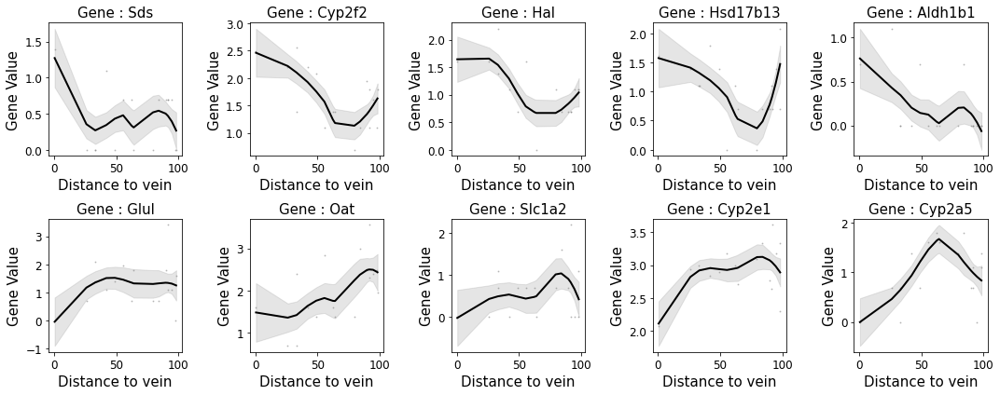

Vein : CN73-D1_30 | P(central) : 0.37350543215354426 | P(portal) : 0.6264945678464557


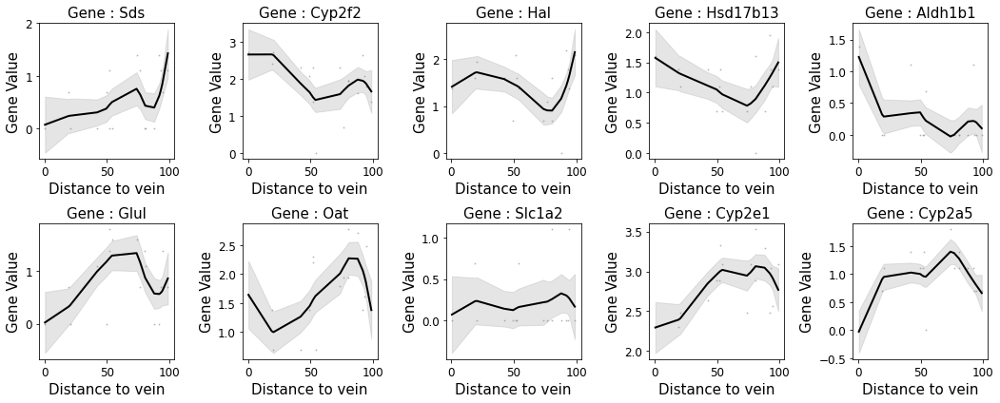

Vein : CN73-D1_31 | P(central) : 0.8404271409940945 | P(portal) : 0.15957285900590543


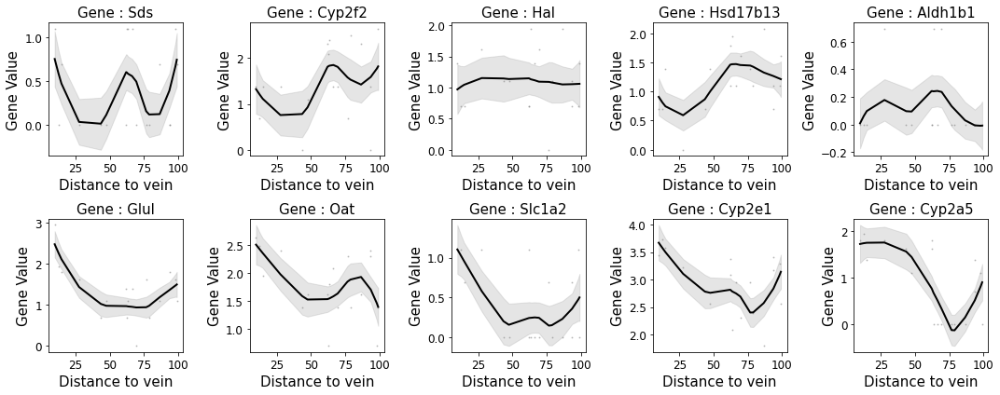

Vein : CN73-D1_32 | P(central) : 0.5289055406835403 | P(portal) : 0.47109445931645966


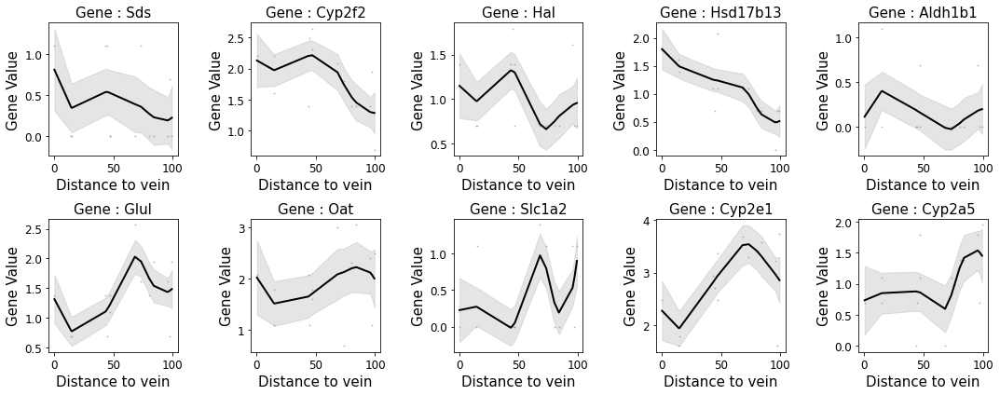

Vein : CN16-E1_46 | P(central) : 0.07253466948308451 | P(portal) : 0.9274653305169155


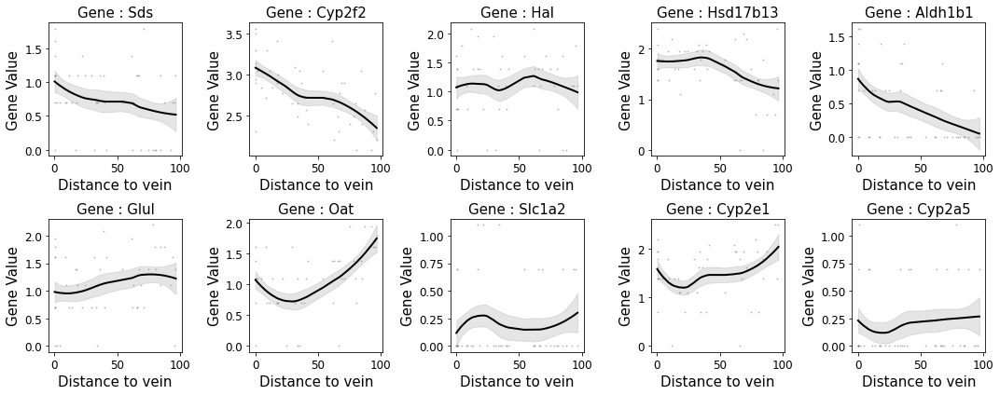

Vein : CN16-E1_47 | P(central) : 0.6996250745176196 | P(portal) : 0.3003749254823804


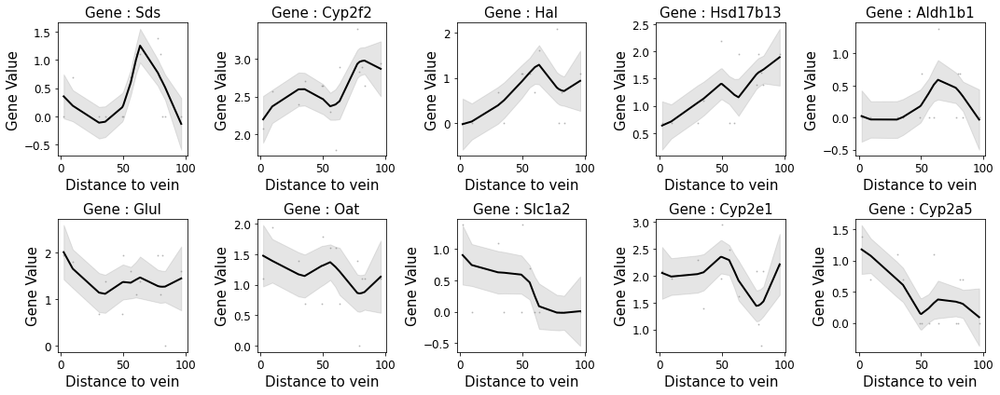

Vein : CN16-E1_48 | P(central) : 0.6247699108443068 | P(portal) : 0.3752300891556933


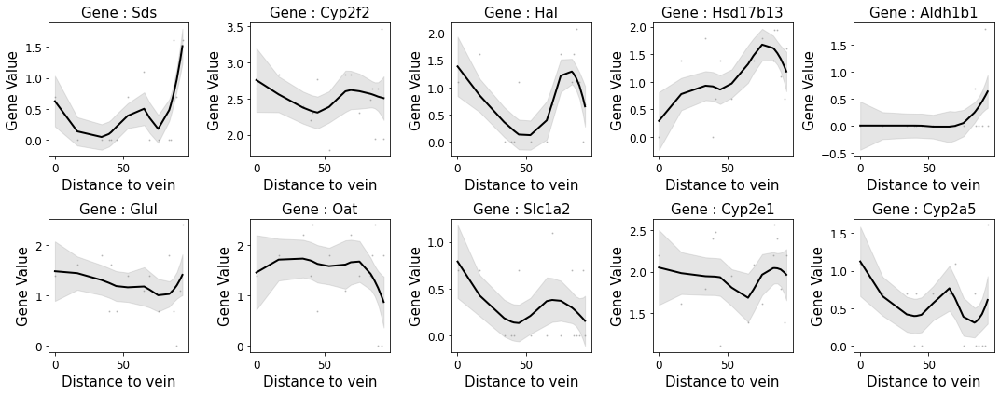

Vein : CN16-E1_49 | P(central) : 0.2186082728914862 | P(portal) : 0.7813917271085138


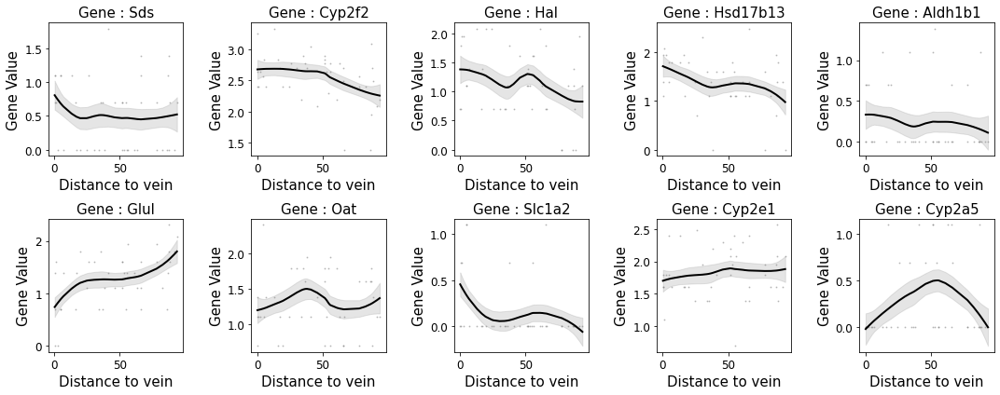

Vein : CN16-E1_50 | P(central) : 0.6541674008665299 | P(portal) : 0.34583259913347014


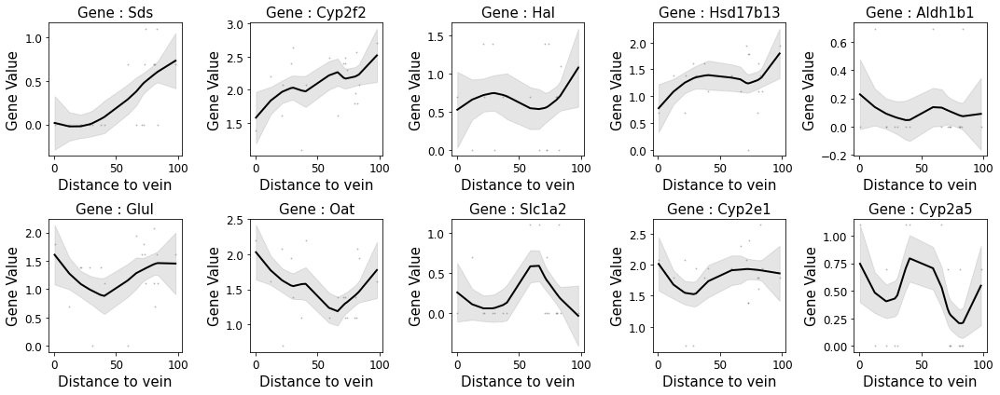

Vein : CN16-E1_51 | P(central) : 0.2527043305315122 | P(portal) : 0.7472956694684878


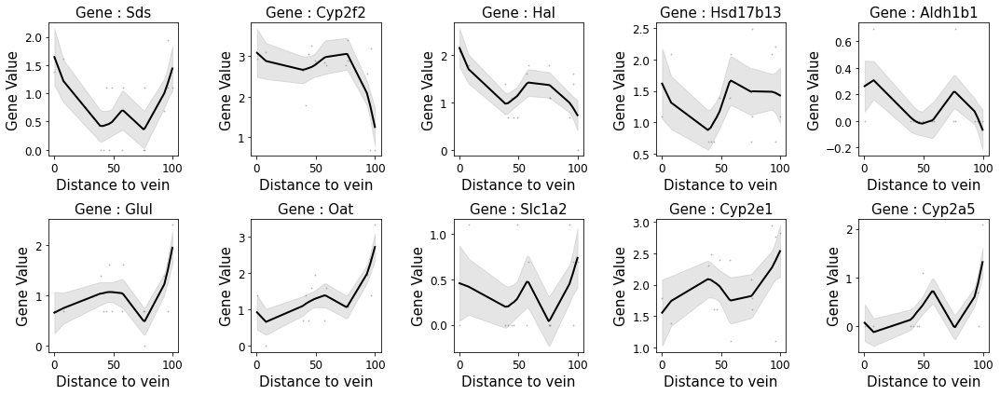

Vein : CN16-E1_52 | P(central) : 0.7371522744531086 | P(portal) : 0.2628477255468914


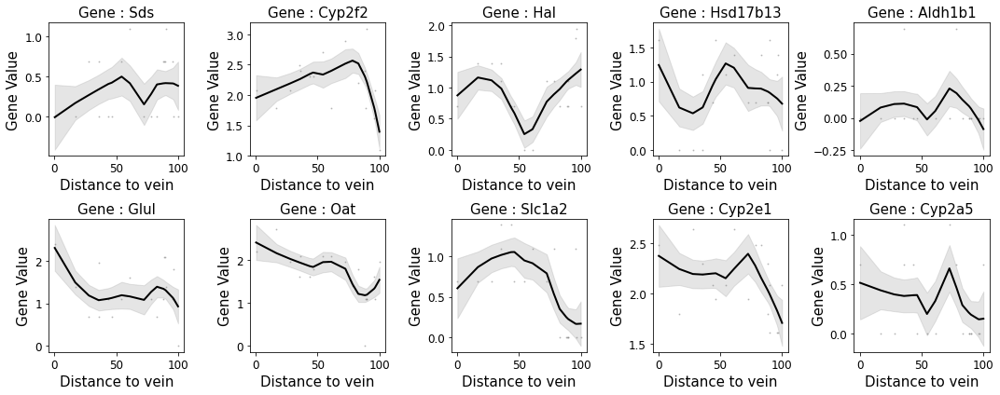

Vein : CN16-E1_53 | P(central) : 0.5360163088108508 | P(portal) : 0.46398369118914917


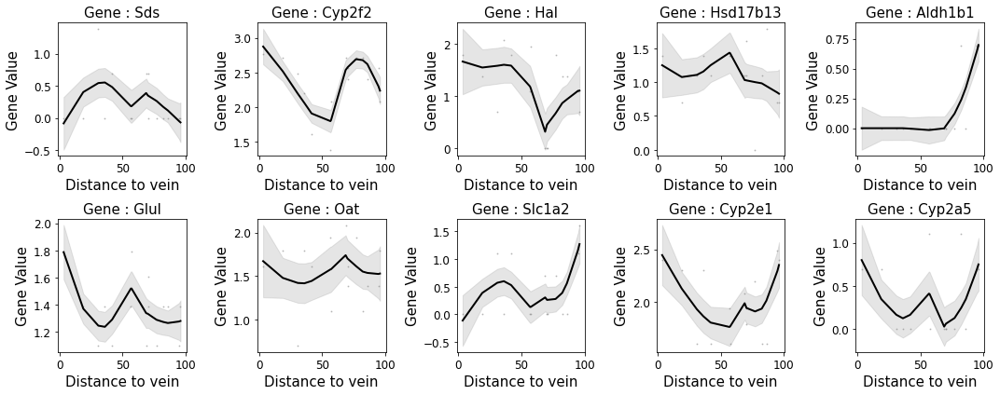

Vein : CN16-E1_54 | P(central) : 0.581706136199619 | P(portal) : 0.41829386380038097


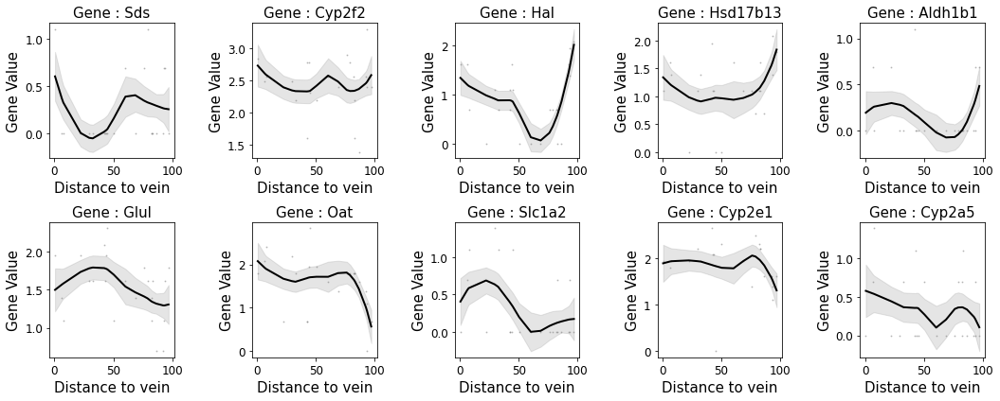

Vein : CN16-E1_55 | P(central) : 0.5054452092113777 | P(portal) : 0.49455479078862236


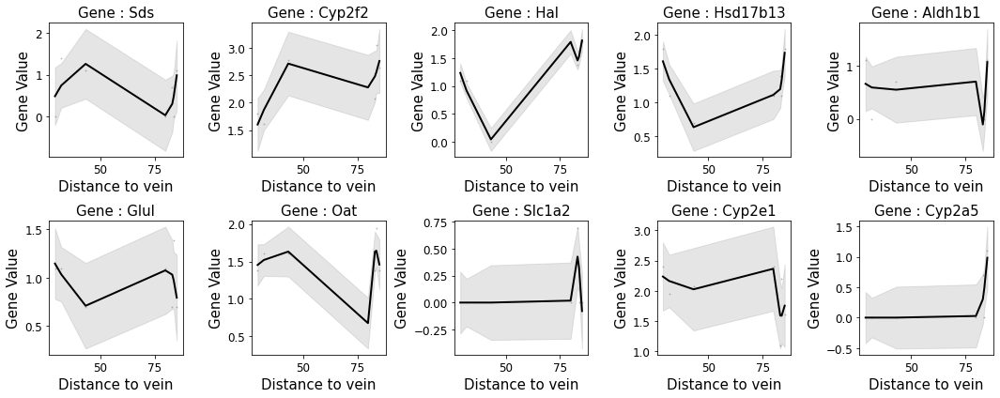

Vein : CN16-E1_56 | P(central) : 0.5215390103460171 | P(portal) : 0.4784609896539829


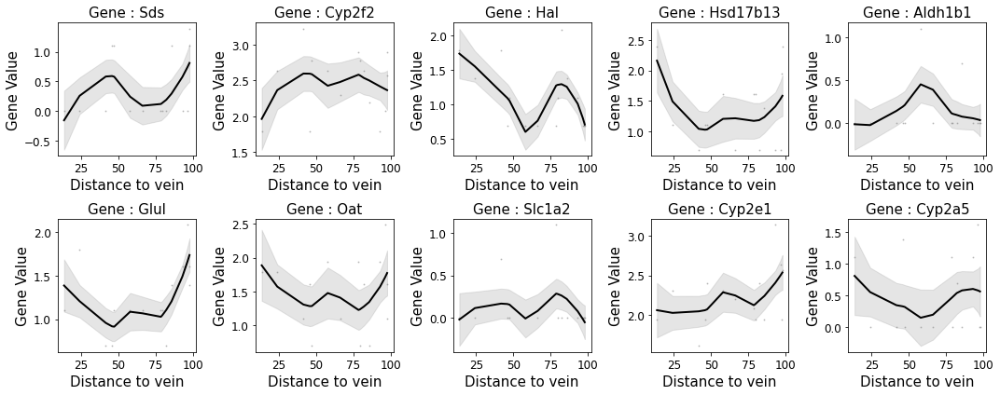

Vein : CN16-E1_57 | P(central) : 0.6438192319923024 | P(portal) : 0.35618076800769766


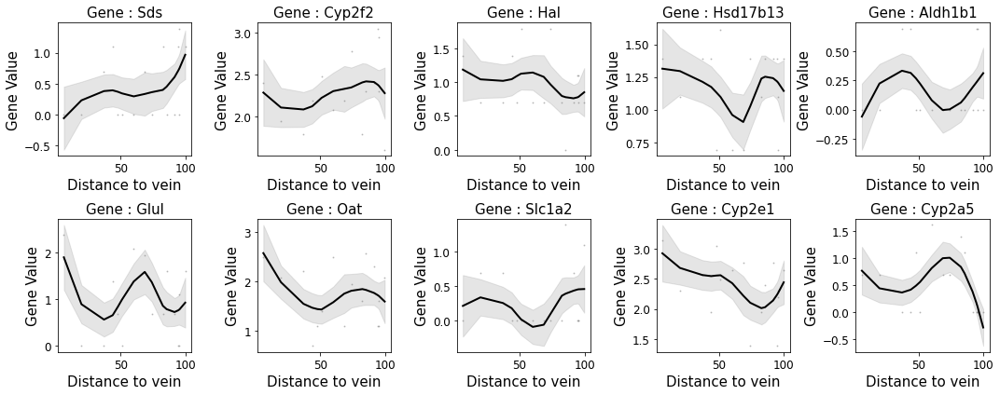

Vein : CN16-E1_58 | P(central) : 0.5588851069538463 | P(portal) : 0.44111489304615376


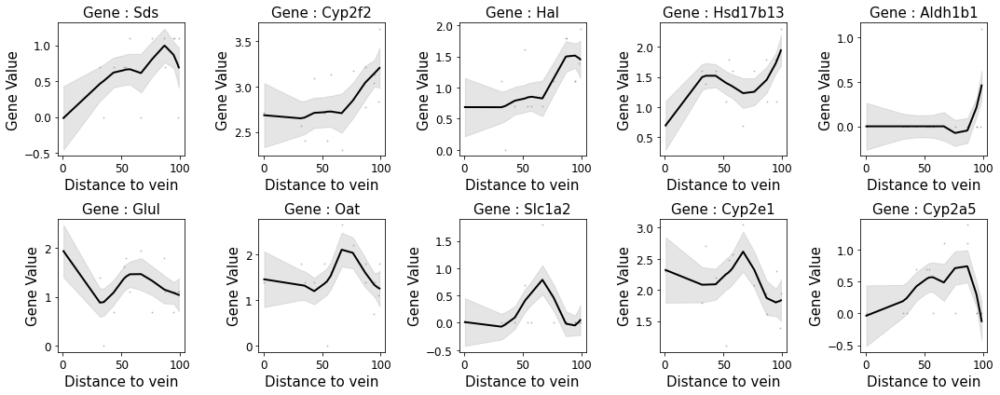

Vein : CN16-E1_59 | P(central) : 0.2594290167307116 | P(portal) : 0.7405709832692884


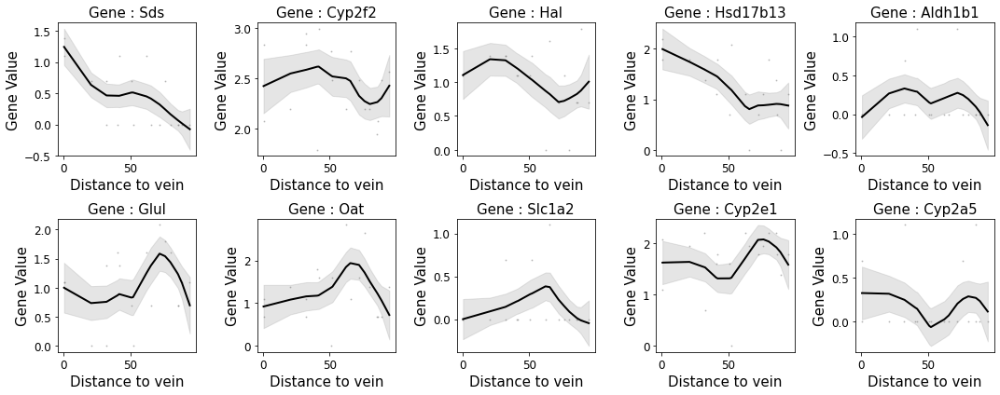

Vein : CN16-E1_60 | P(central) : 0.29330063272882145 | P(portal) : 0.7066993672711785


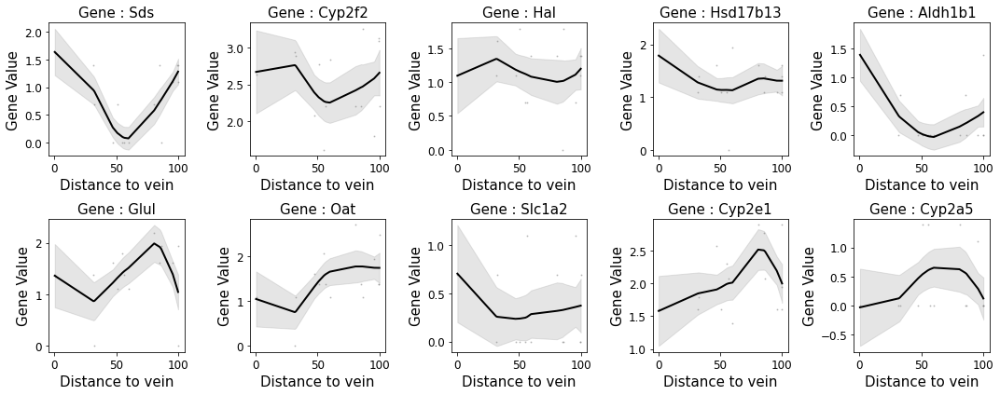

Vein : CN16-E1_61 | P(central) : 0.6040567466309561 | P(portal) : 0.39594325336904385


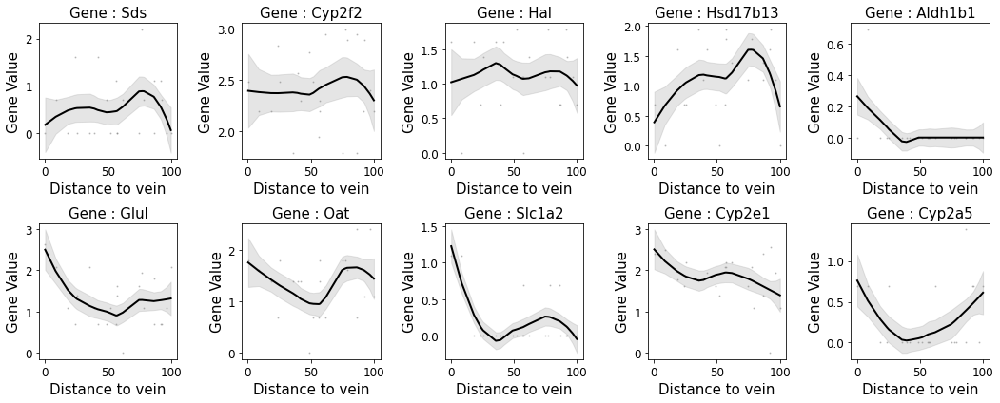

Vein : CN16-E1_62 | P(central) : 0.3118797191899152 | P(portal) : 0.6881202808100848


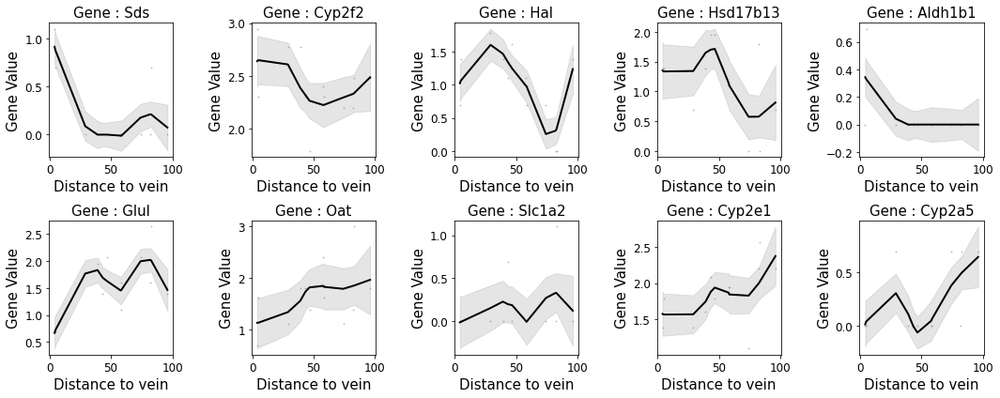

Vein : CN16-E1_63 | P(central) : 0.759892327773277 | P(portal) : 0.24010767222672305


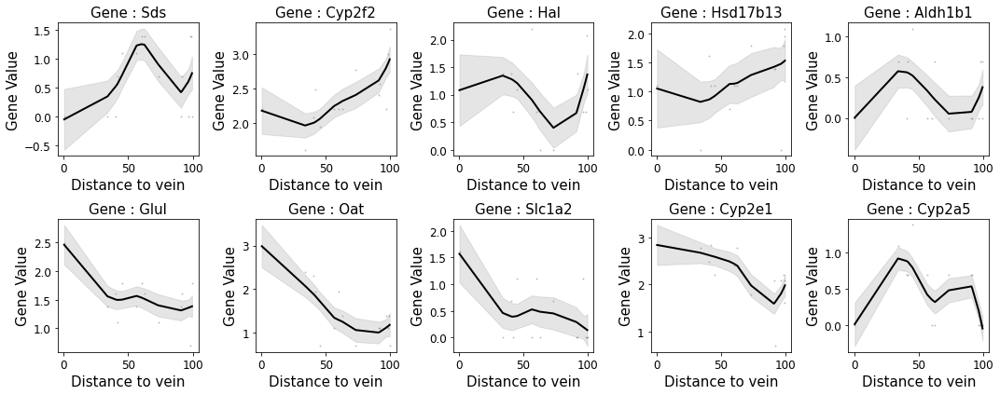

Vein : CN16-E1_64 | P(central) : 0.5299116862162723 | P(portal) : 0.4700883137837278


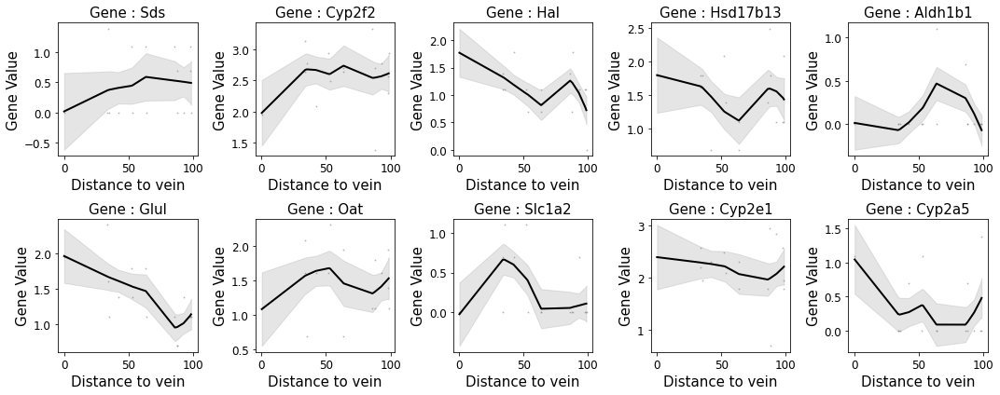

Vein : CN16-E1_65 | P(central) : 0.5723607866547031 | P(portal) : 0.4276392133452969


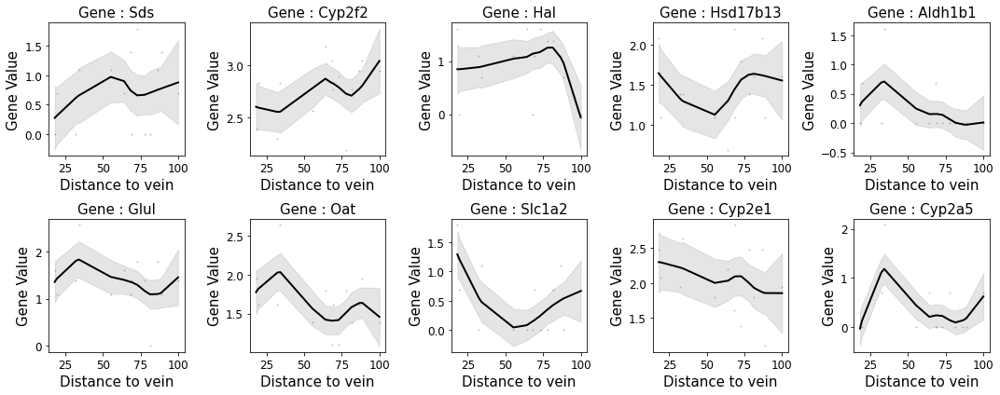

Vein : CN16-E1_66 | P(central) : 0.22949094058213415 | P(portal) : 0.7705090594178658


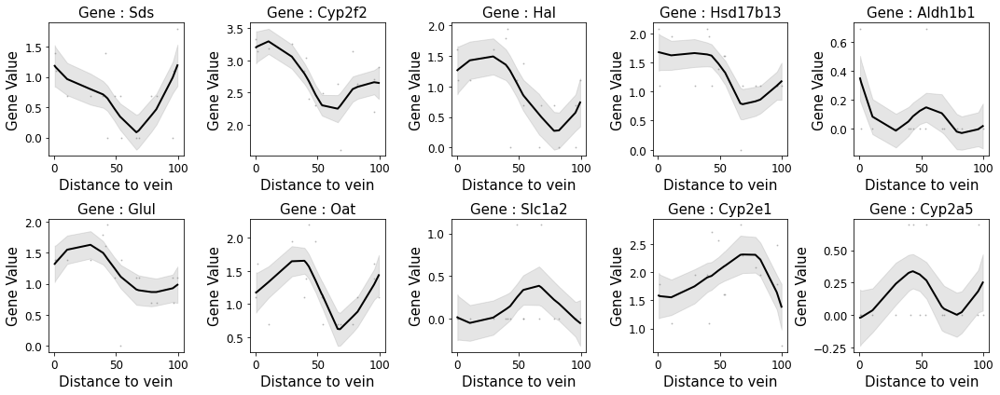

Vein : CN16-E1_67 | P(central) : 0.8207830198415479 | P(portal) : 0.17921698015845208


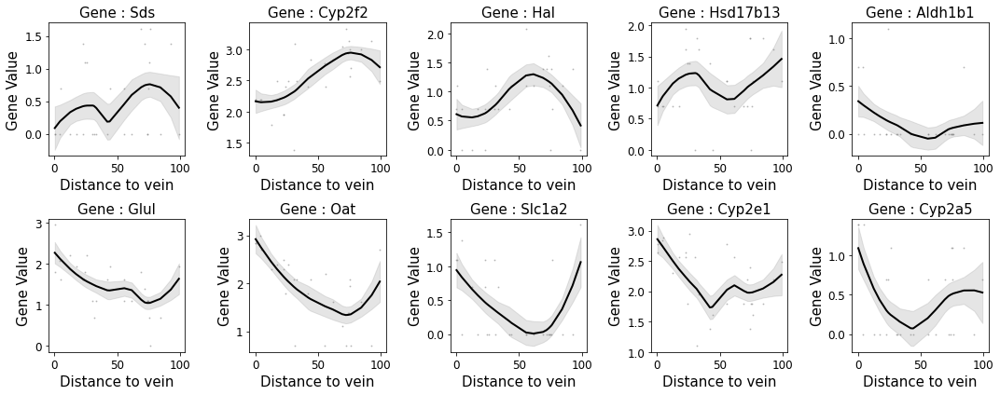

Vein : CN16-E1_68 | P(central) : 0.28780466349505285 | P(portal) : 0.7121953365049472


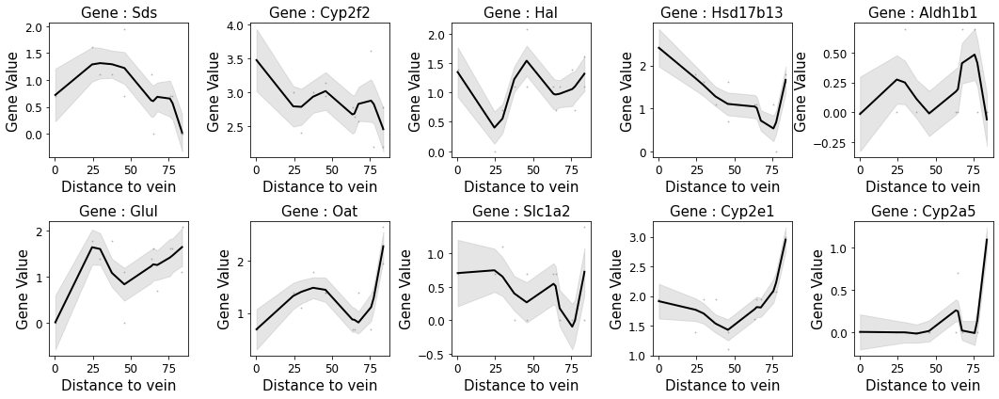

Vein : CN73-C1_16 | P(central) : 0.9065853529494561 | P(portal) : 0.09341464705054395


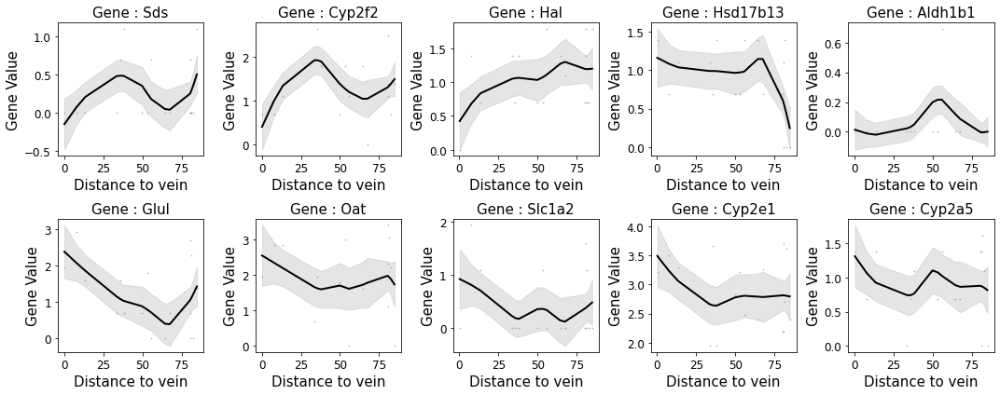

Vein : CN73-C1_17 | P(central) : 0.8127545816622916 | P(portal) : 0.18724541833770839


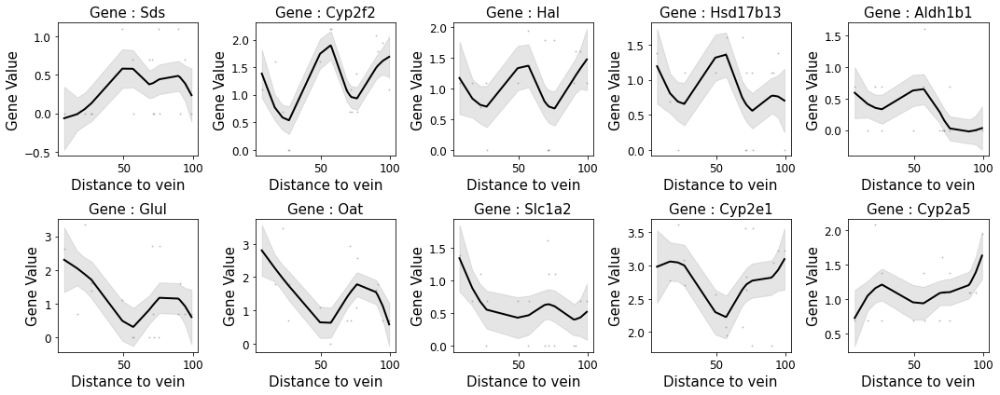

Vein : CN73-C1_18 | P(central) : 0.1198580149236963 | P(portal) : 0.8801419850763037


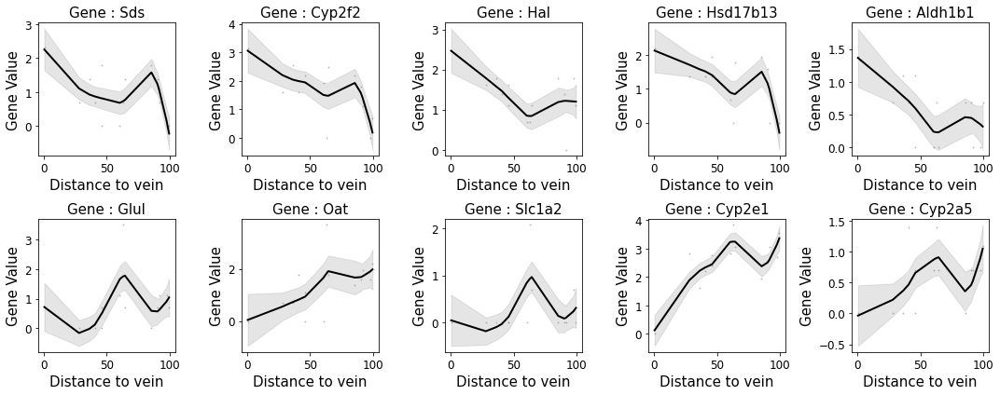

Vein : CN73-C1_19 | P(central) : 0.7741147725598838 | P(portal) : 0.22588522744011622


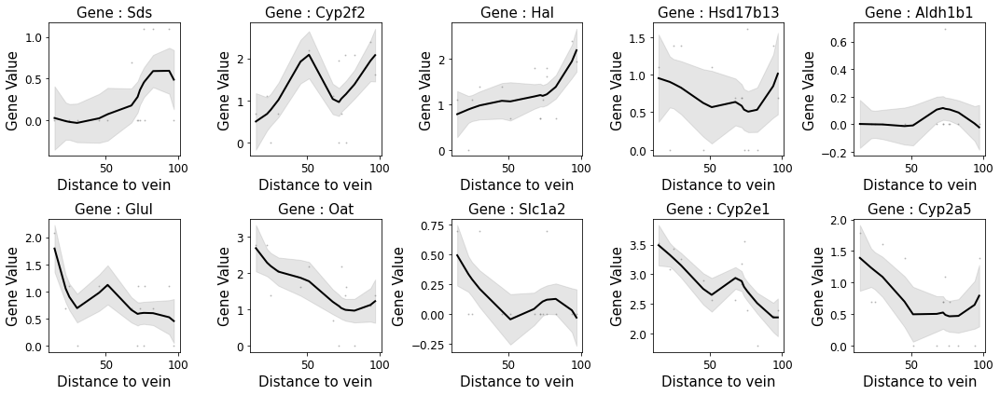

Vein : CN73-C1_20 | P(central) : 0.24890866753751117 | P(portal) : 0.7510913324624888


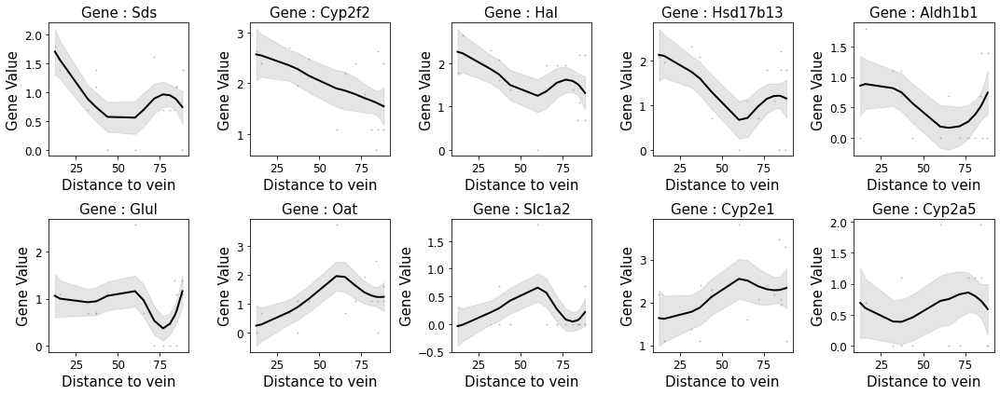

Vein : CN73-C1_21 | P(central) : 0.8162387297626779 | P(portal) : 0.18376127023732214


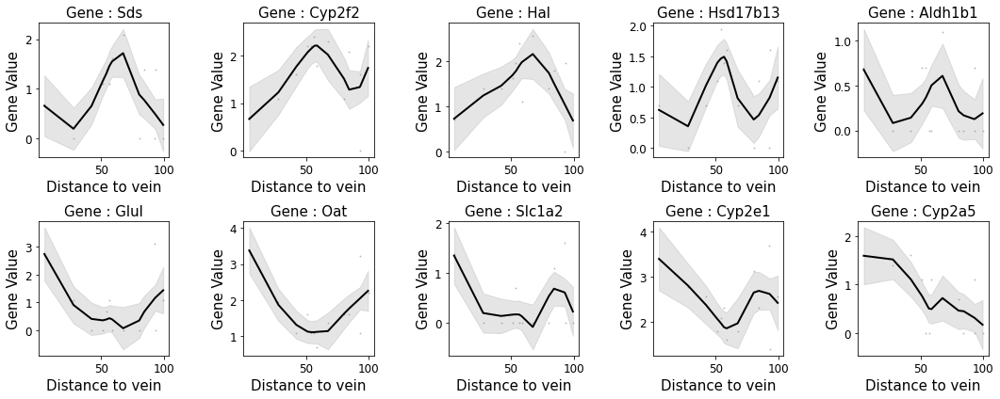

Vein : CN73-C1_22 | P(central) : 0.9061412867156616 | P(portal) : 0.0938587132843384


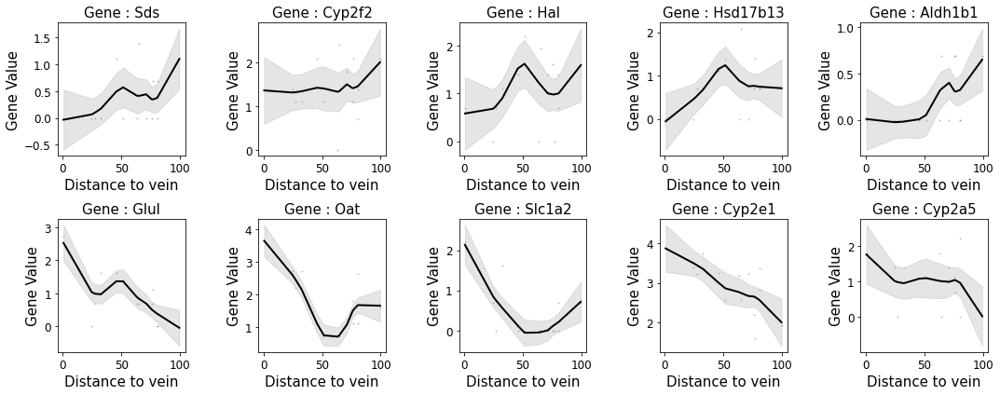

Vein : CN73-C1_23 | P(central) : 0.23254034531835222 | P(portal) : 0.7674596546816478


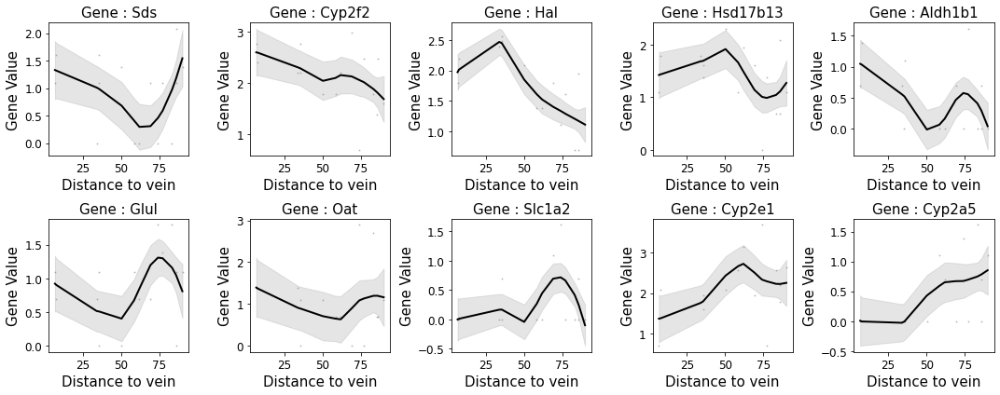

Vein : CN73-C1_24 | P(central) : 0.8817948297129791 | P(portal) : 0.11820517028702096


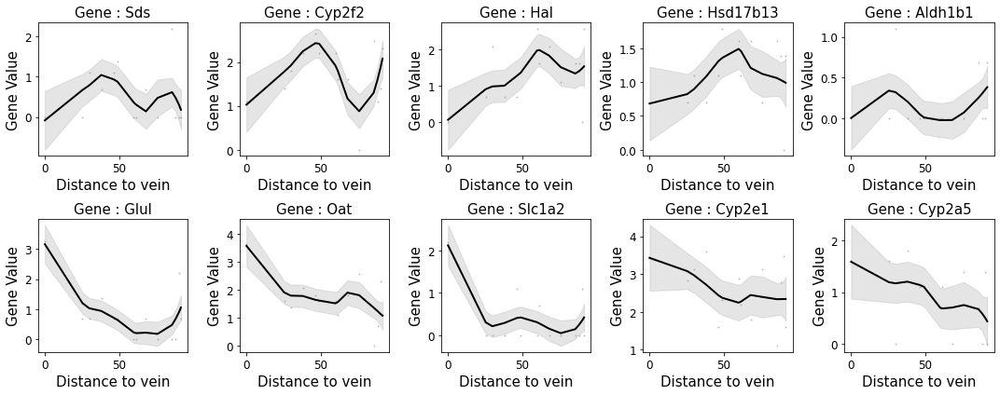

Vein : CN73-C1_25 | P(central) : 0.36242249656176617 | P(portal) : 0.6375775034382338


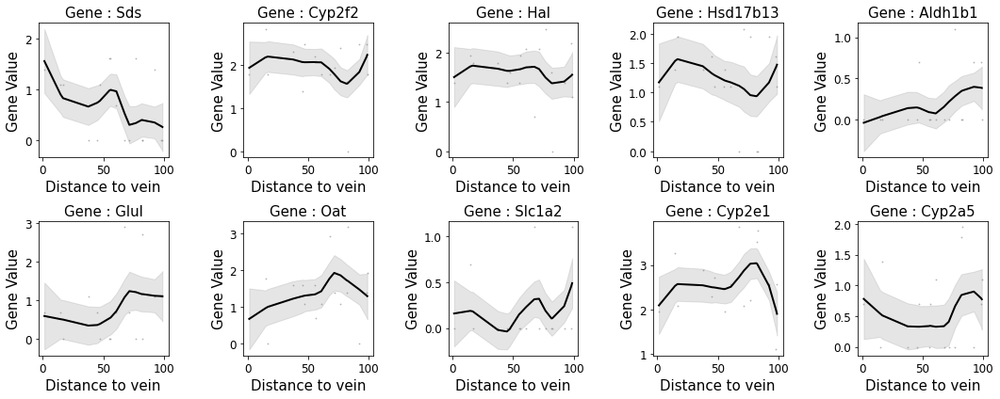

Vein : CN65-D1_5 | P(central) : 0.8669346843744806 | P(portal) : 0.13306531562551938


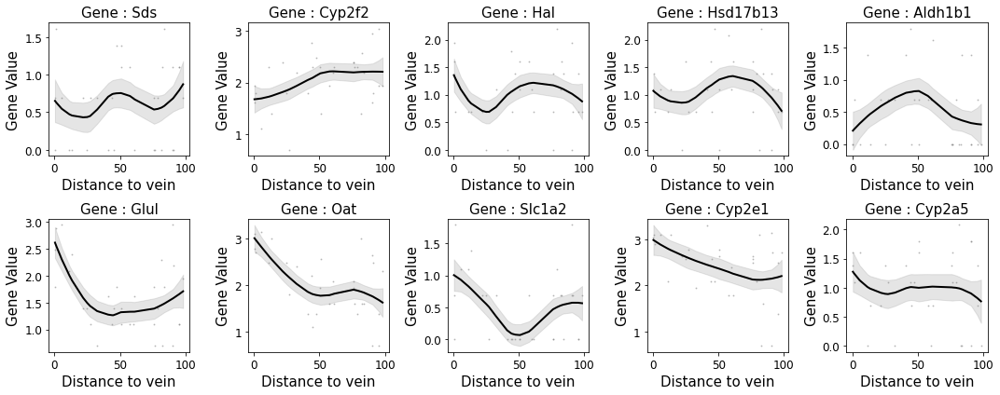

Vein : CN65-D1_6 | P(central) : 0.8946327291395147 | P(portal) : 0.10536727086048524


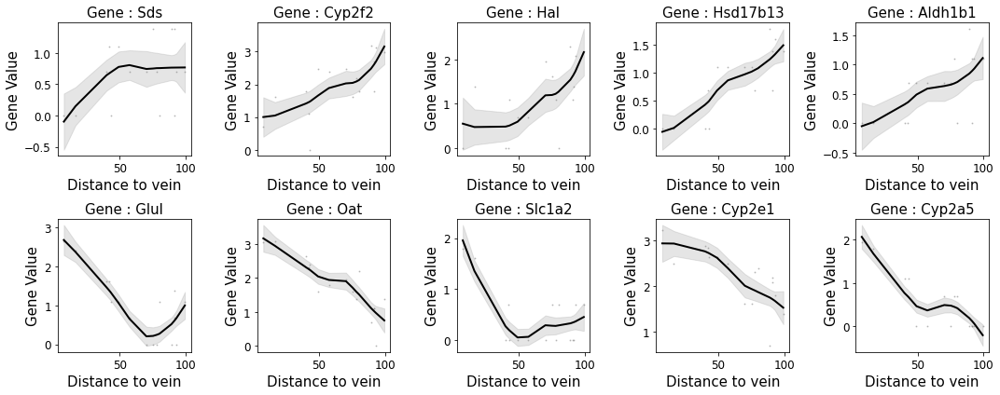

Vein : CN65-D1_7 | P(central) : 0.8607590134202477 | P(portal) : 0.13924098657975223


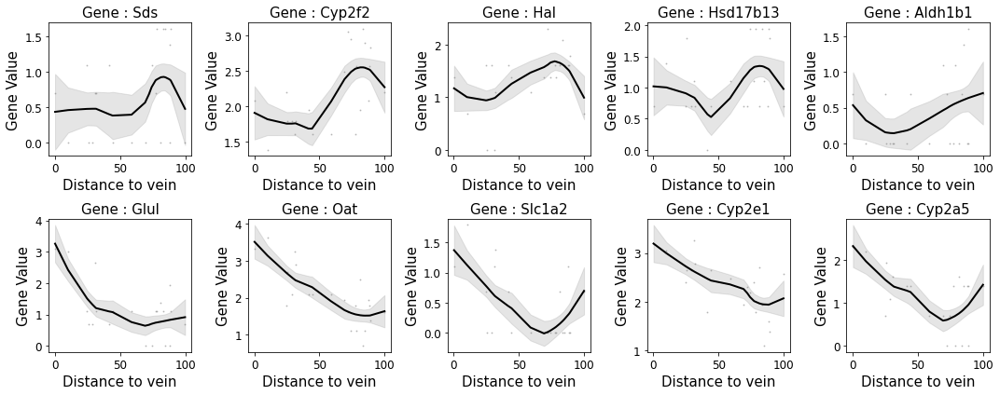

Vein : CN16-D2_19 | P(central) : 0.339758150139868 | P(portal) : 0.660241849860132


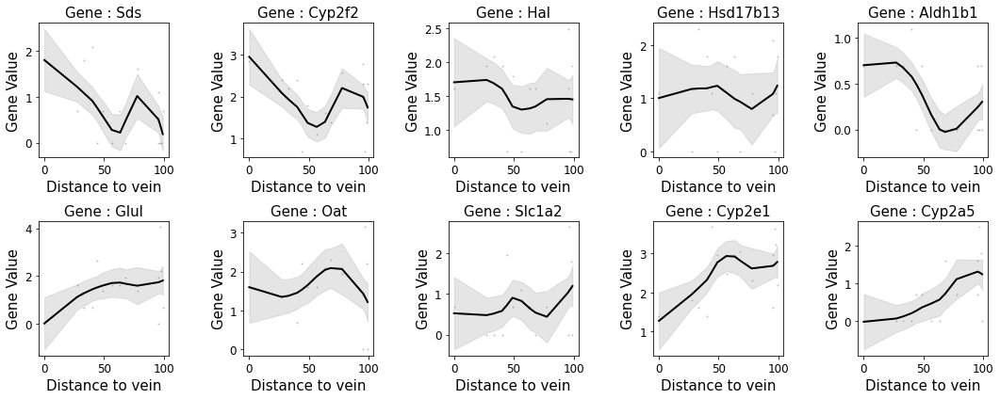

Vein : CN16-D2_20 | P(central) : 0.29931767891396 | P(portal) : 0.70068232108604


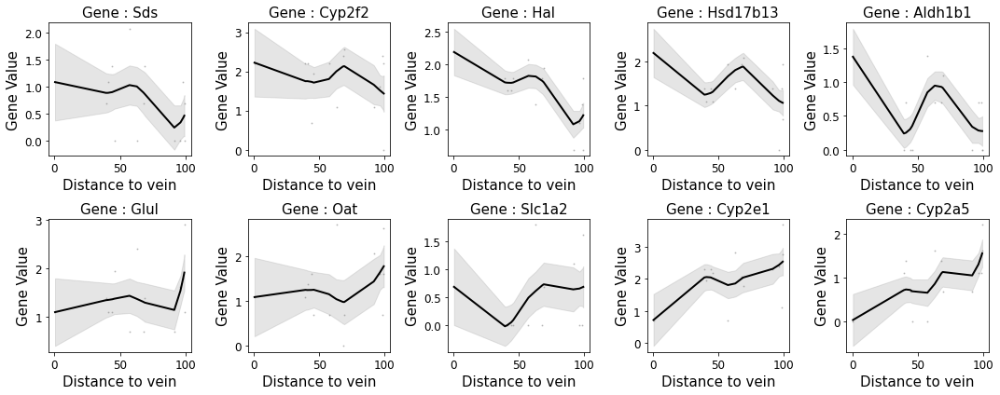

Vein : CN16-D2_21 | P(central) : 0.26328080981883184 | P(portal) : 0.7367191901811682


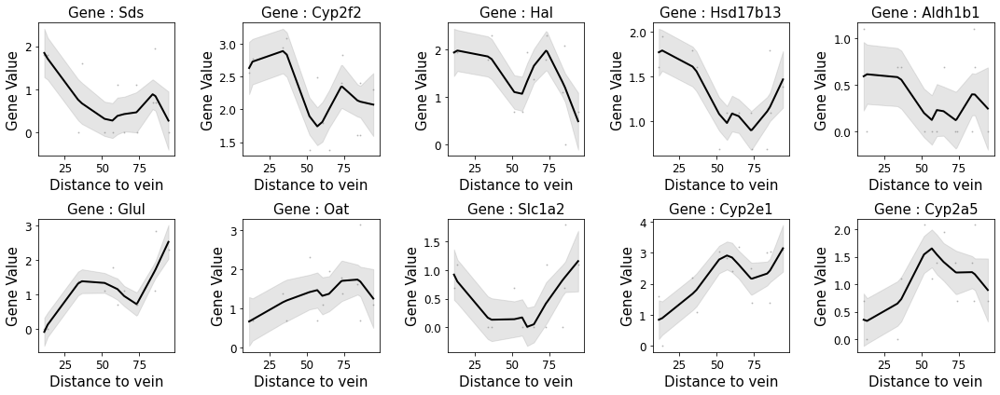

Vein : CN16-D2_22 | P(central) : 0.3825236836259742 | P(portal) : 0.6174763163740258


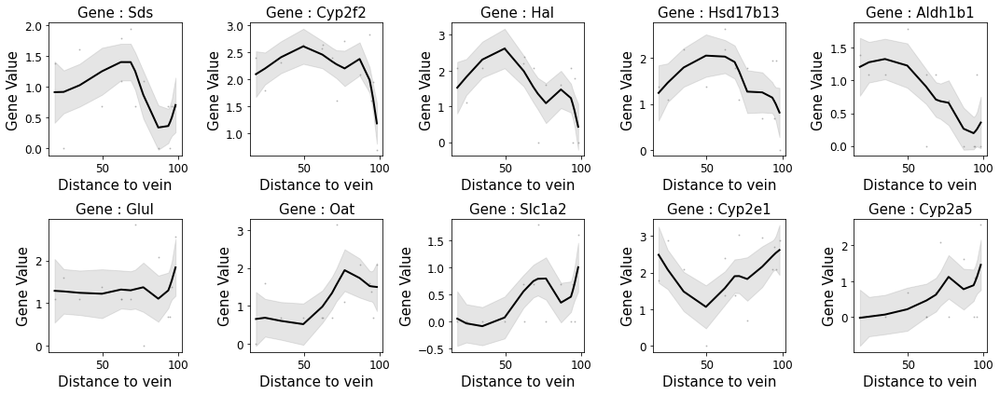

Vein : CN16-D2_23 | P(central) : 0.856385073877818 | P(portal) : 0.14361492612218196


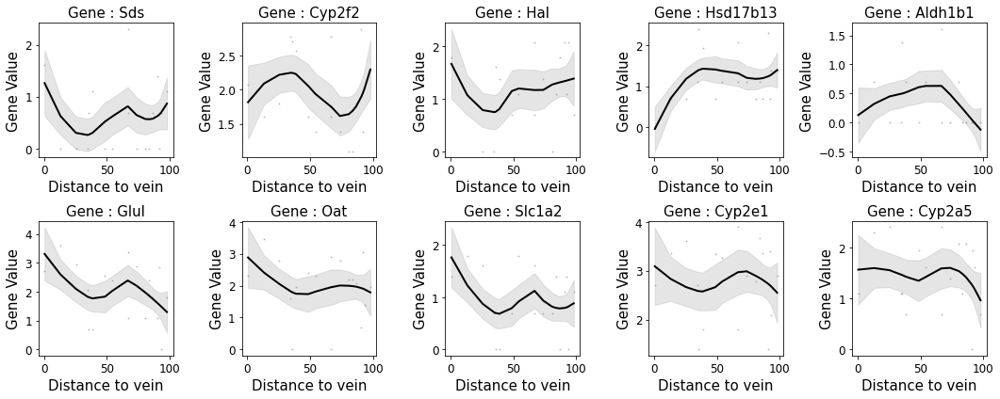

Vein : CN16-D2_24 | P(central) : 0.9250663565214415 | P(portal) : 0.07493364347855845


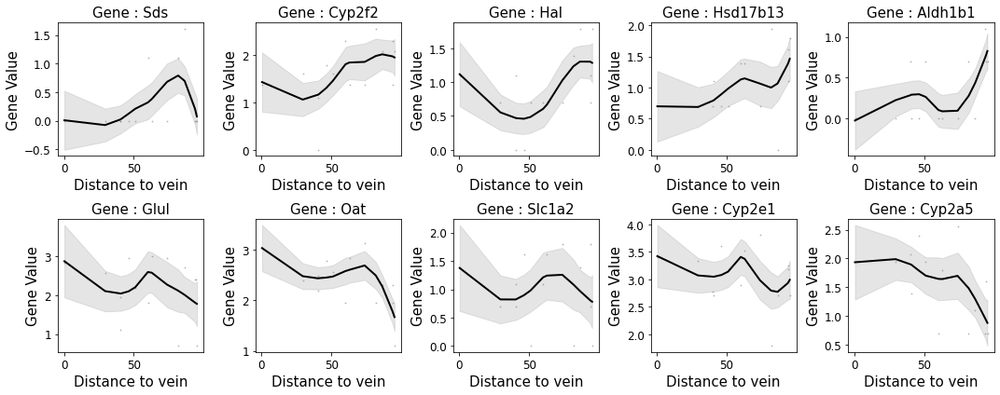

Vein : CN73-E2_26 | P(central) : 0.3587129002106798 | P(portal) : 0.6412870997893202


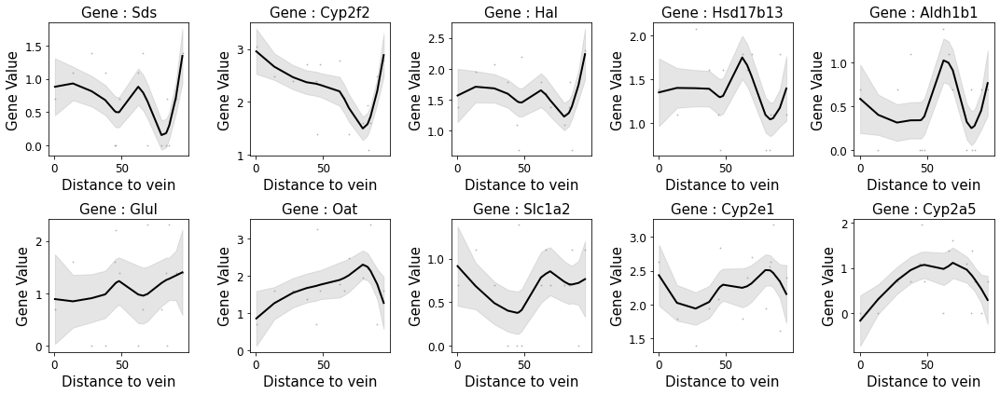

Vein : CN73-E2_27 | P(central) : 0.9807427831798002 | P(portal) : 0.019257216820199756


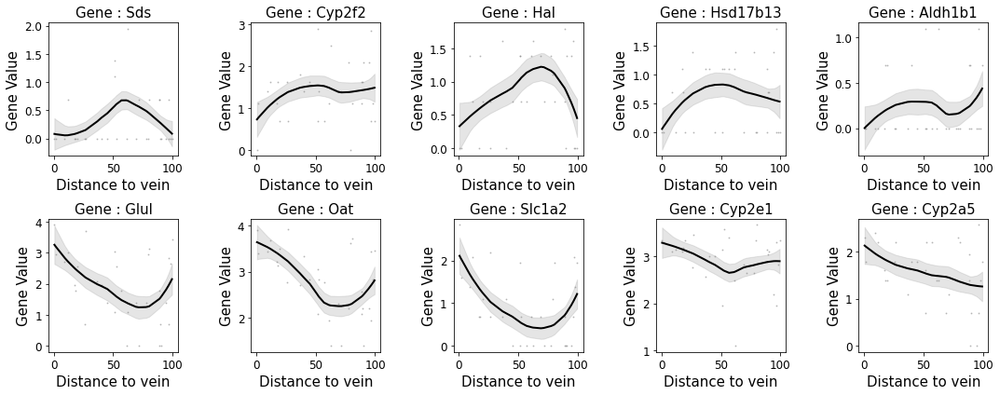

Vein : CN73-E2_28 | P(central) : 0.4850040771808417 | P(portal) : 0.5149959228191583


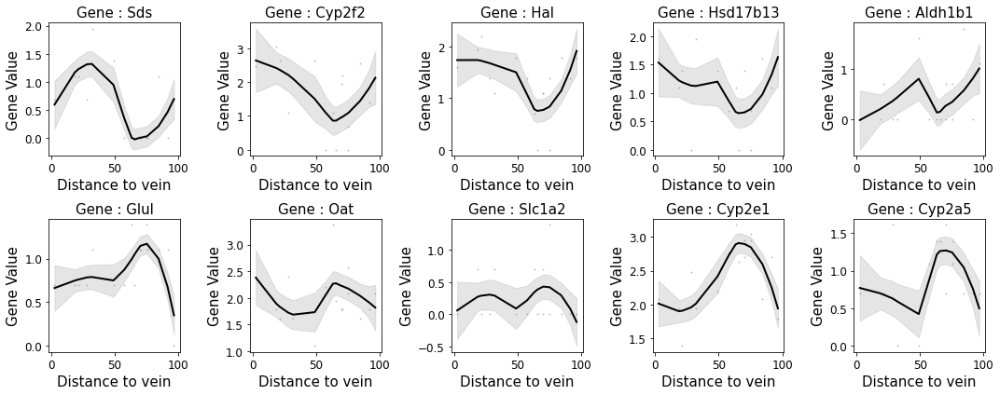

Vein : CN73-E2_29 | P(central) : 0.9916691021941479 | P(portal) : 0.008330897805852023


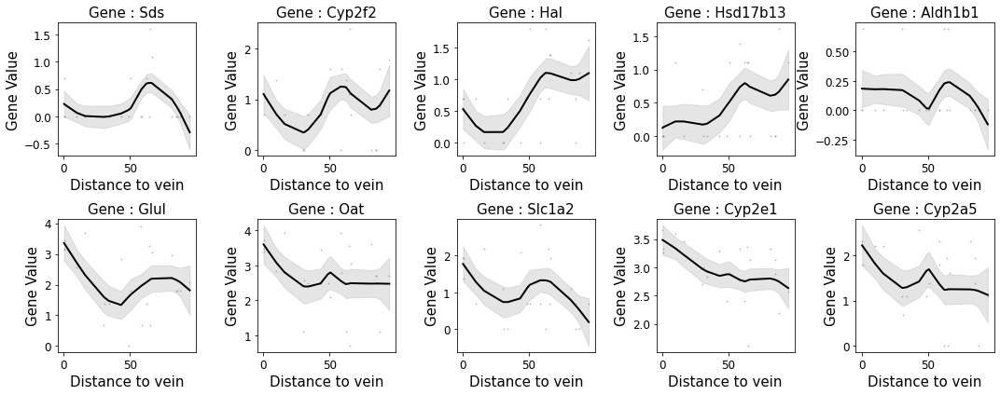

Vein : CN73-E2_30 | P(central) : 0.5322853613474784 | P(portal) : 0.4677146386525216


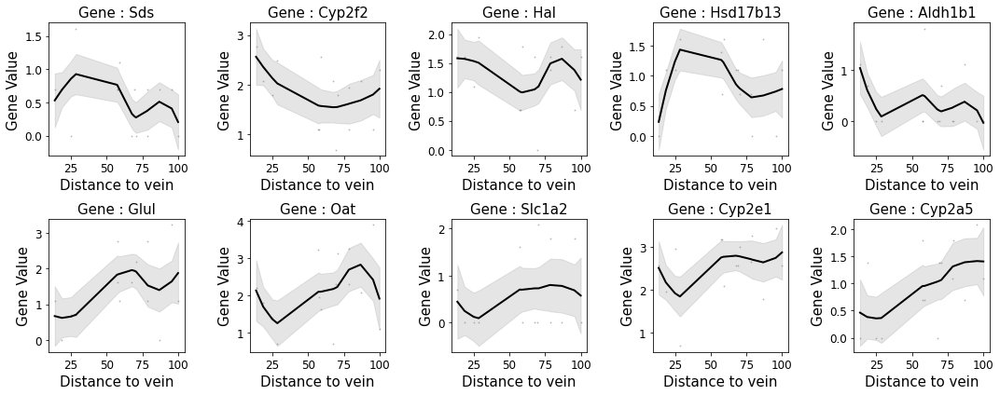

Vein : CN73-E2_31 | P(central) : 0.8152607243782997 | P(portal) : 0.1847392756217004


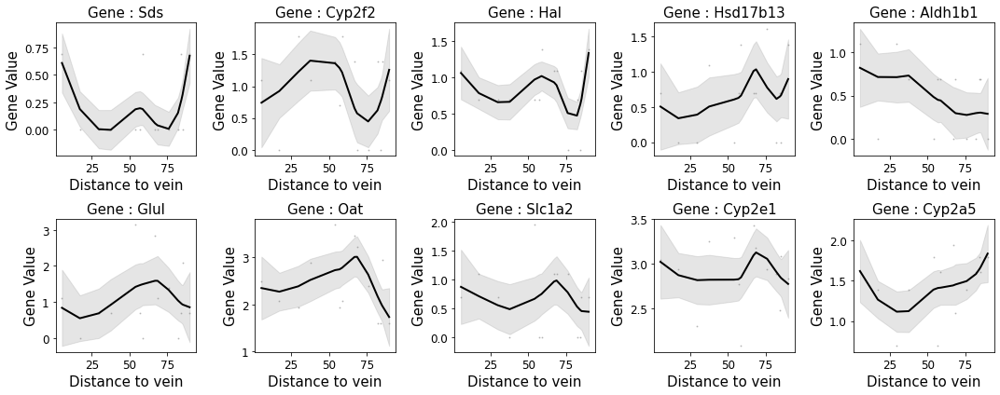

Vein : CN73-E2_32 | P(central) : 0.32207667469587464 | P(portal) : 0.6779233253041254


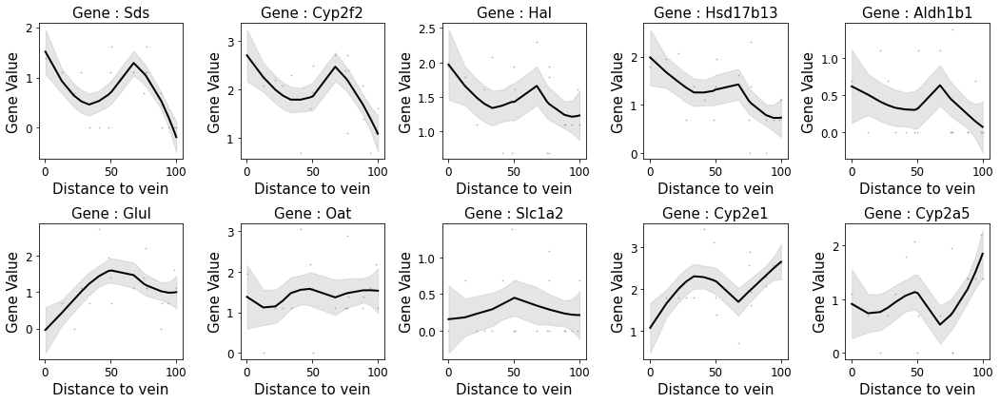

Vein : CN73-E2_33 | P(central) : 0.28343636095701064 | P(portal) : 0.7165636390429894


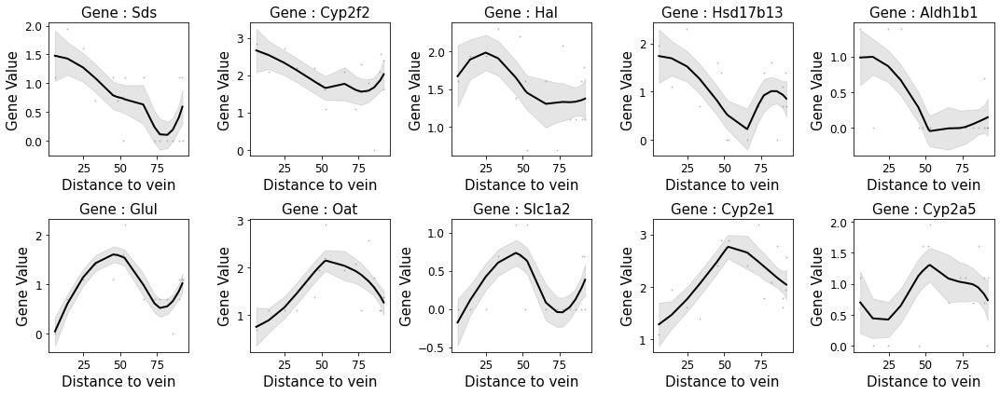

Vein : CN73-E2_34 | P(central) : 0.5569417321451129 | P(portal) : 0.4430582678548871


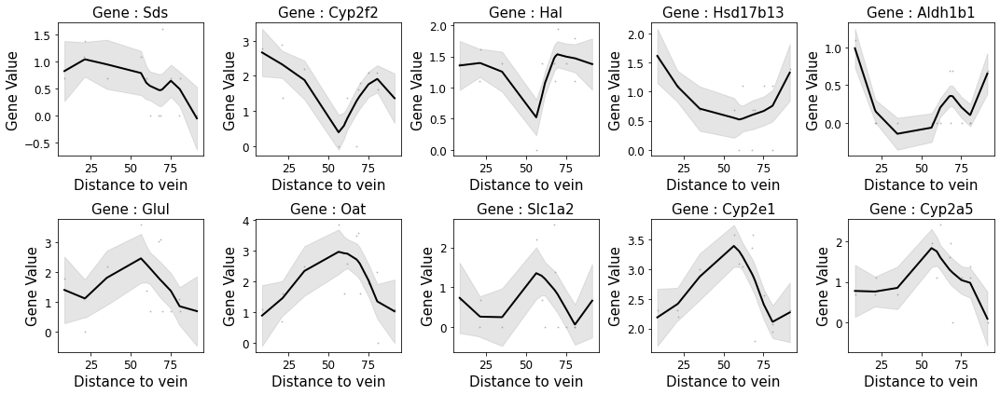

Vein : CN73-E2_35 | P(central) : 0.29030878609248434 | P(portal) : 0.7096912139075157


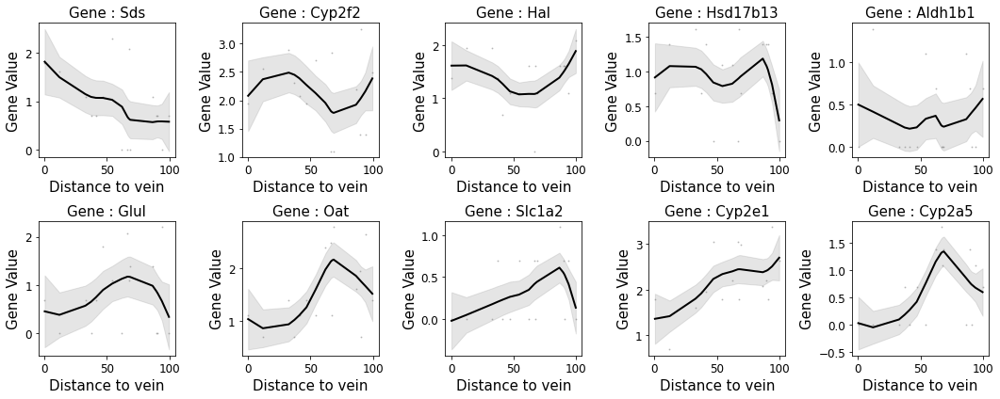

Vein : CN73-E2_36 | P(central) : 0.9870711794481262 | P(portal) : 0.012928820551873815


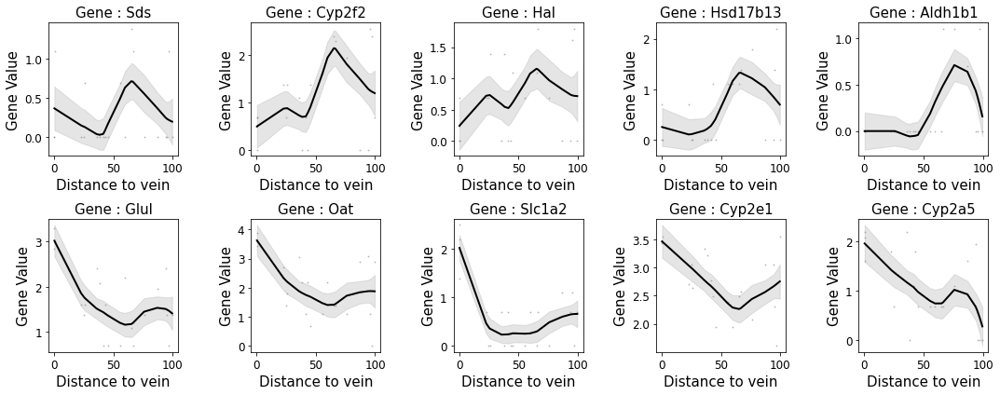

Vein : CN73-E2_37 | P(central) : 0.2775044527457451 | P(portal) : 0.7224955472542549


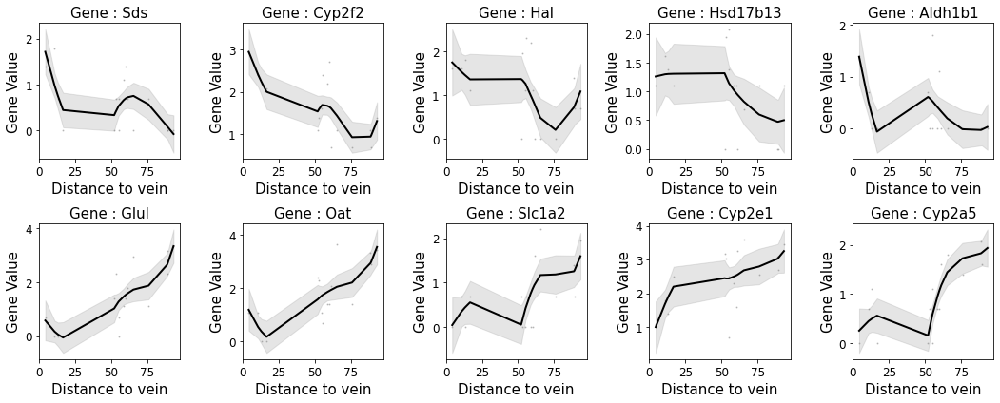

Vein : CN16-E2_12 | P(central) : 0.15673259828134345 | P(portal) : 0.8432674017186566


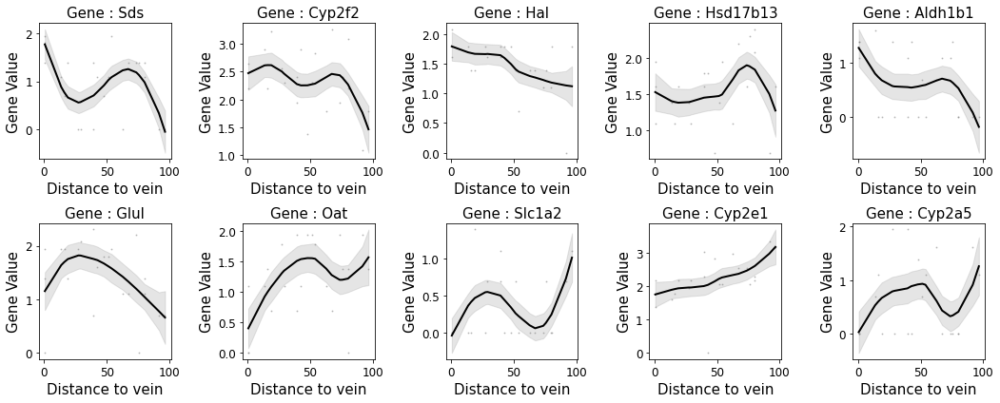

Vein : CN16-E2_13 | P(central) : 0.22688903716571585 | P(portal) : 0.7731109628342842


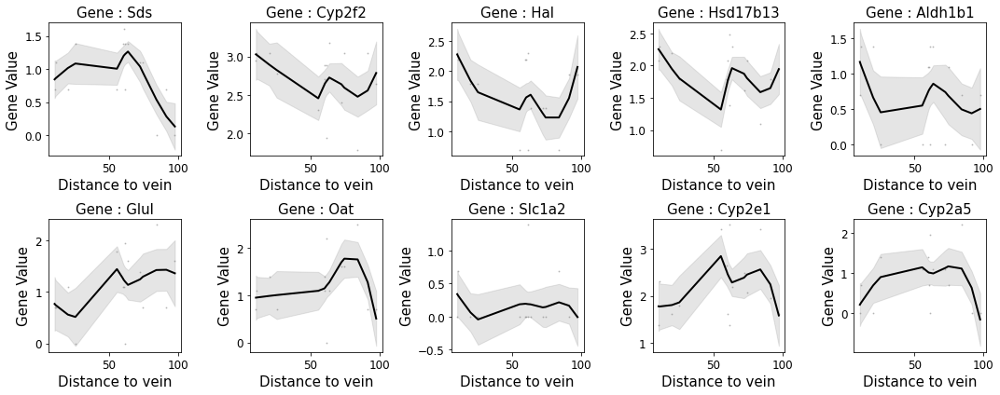

Vein : CN16-E2_14 | P(central) : 0.16034571769039296 | P(portal) : 0.839654282309607


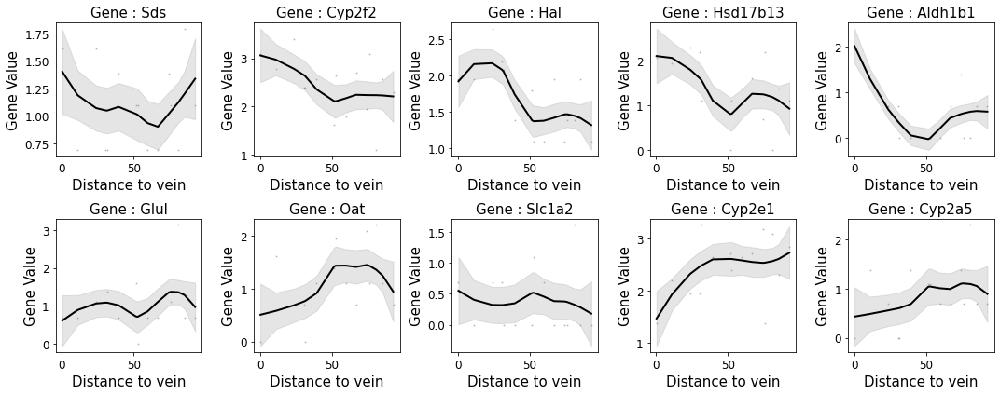

Vein : CN16-E2_15 | P(central) : 0.3075655985002822 | P(portal) : 0.6924344014997178


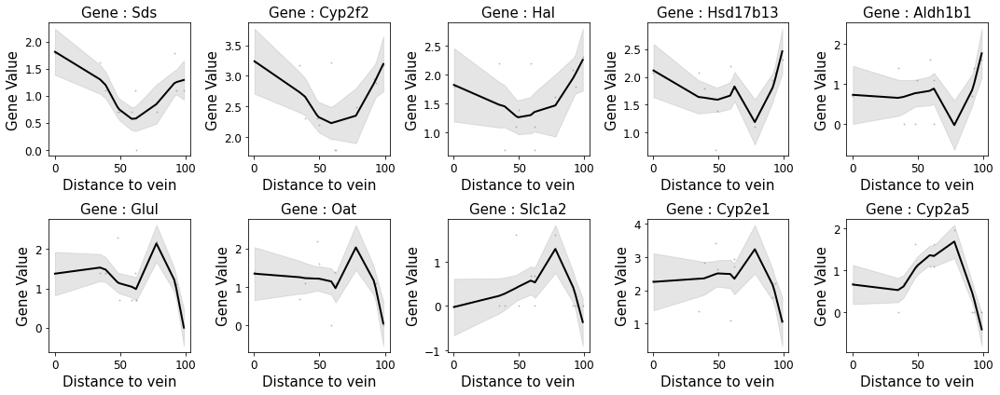

Vein : CN16-E2_16 | P(central) : 0.38057263004969 | P(portal) : 0.61942736995031


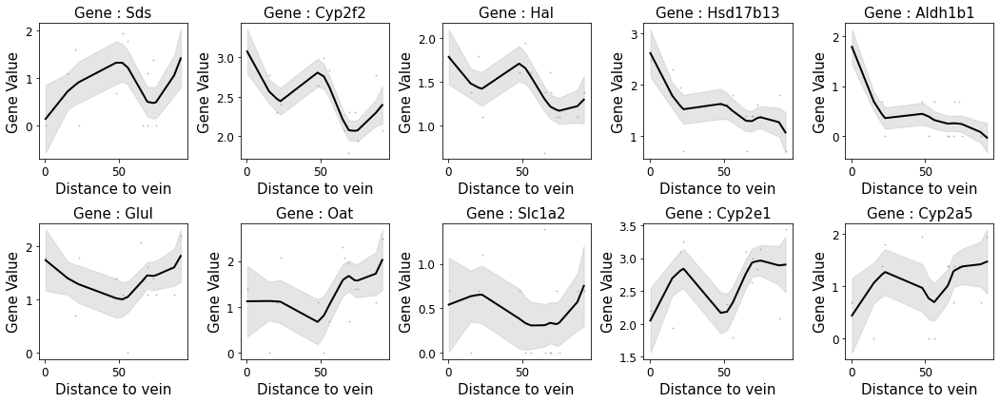

Vein : CN16-E2_17 | P(central) : 0.2742293648799091 | P(portal) : 0.7257706351200909


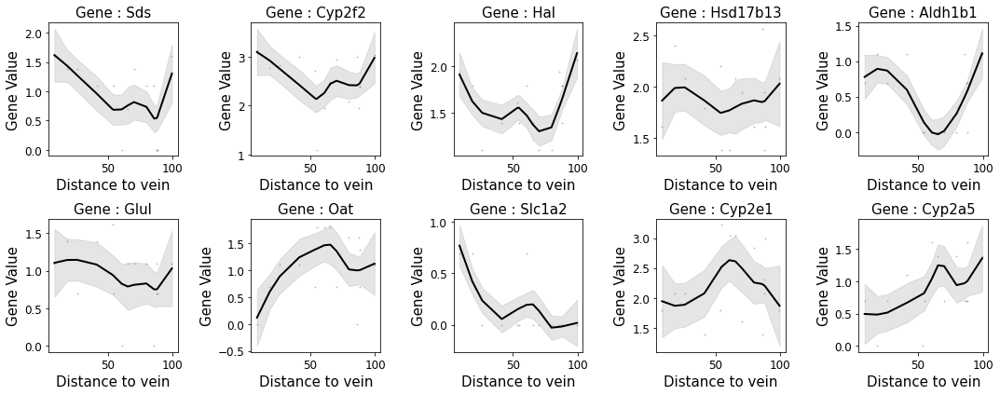

Vein : CN16-E2_18 | P(central) : 0.2514328109339856 | P(portal) : 0.7485671890660144


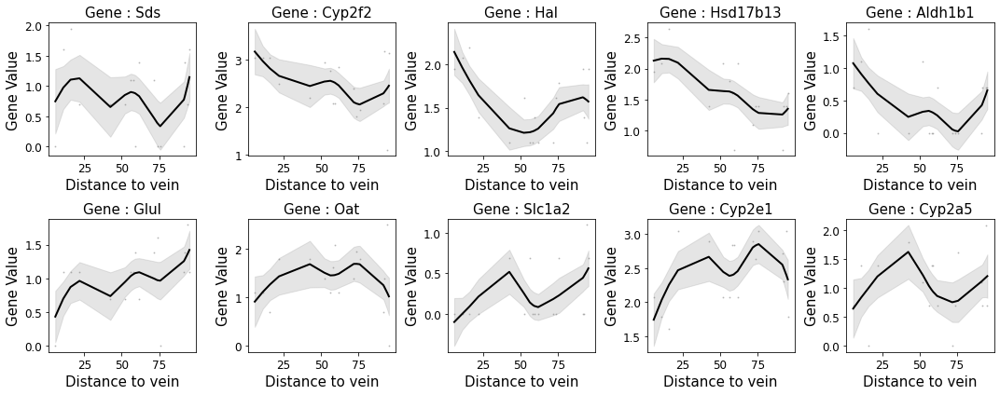

Vein : CN16-E2_19 | P(central) : 0.3320744662647144 | P(portal) : 0.6679255337352856


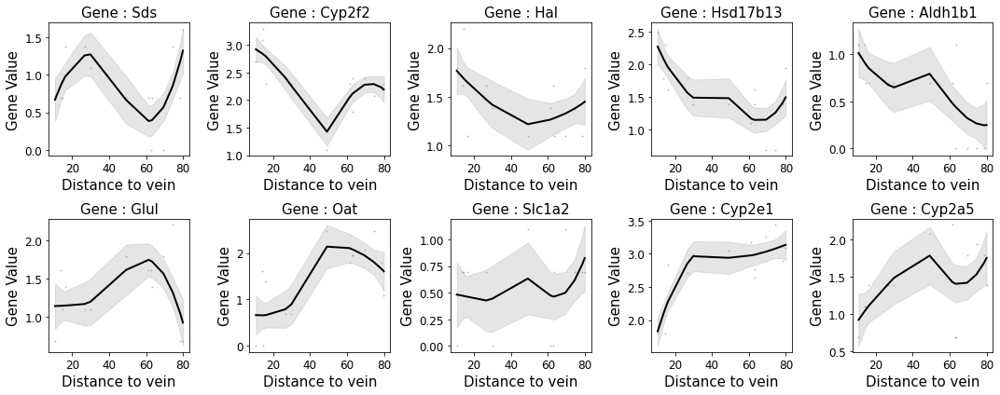

Vein : CN16-E2_20 | P(central) : 0.17224461232322064 | P(portal) : 0.8277553876767794


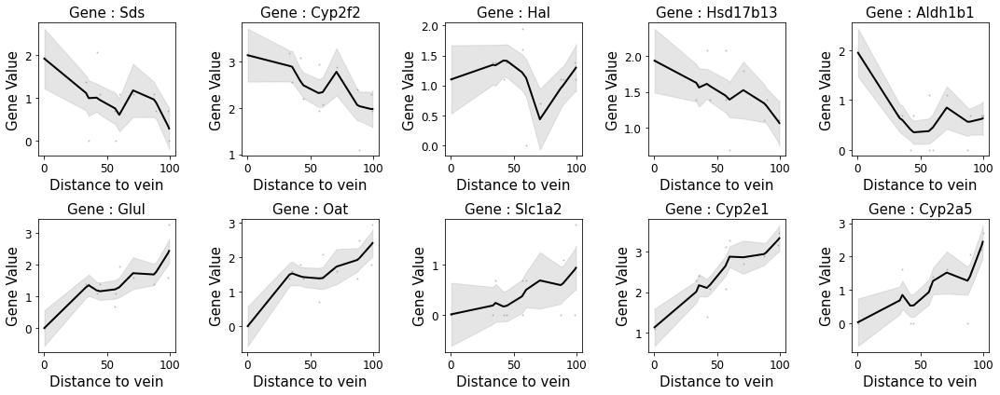

In [22]:


for vein_id in predict.index:
    pc,pp = predict.loc[vein_id,:]
    print("Vein : {} | P(central) : {} | P(portal) : {}".format(vein_id,
                                                                pc,
                                                                pp,
                                                               ))
    fig,ax = ut.get_figure(n_elements=len(vein_genes),
                          n_cols = 5,
                           side_size = 3,
                          )
    
    sample_id = vein_id.split("_")[0]
    
    crd = data_set[sample_id].obs[["x","y"]].values

    dists = vein_data.get_distance_to_vein(crd = crd,
                                           vein_id = vein_id)

    for k,gene in enumerate(vein_genes):
        expr = data_set[sample_id].obs_vector(gene)
        smoothed = ut.smooth_fit(dists,expr,dist_thrs=100)
        
        ut.plot_expression_by_distance(ax[k],
                                       smoothed,
                                       feature = gene,
                                       feature_type = "Gene",
                                       title_fontsize = 18,
                                       label_fontsize = 15,
                                       tick_fontsize = 12,
                                      )
    
    fig.tight_layout()
    if SAVE_RESULTS:
        PRED_DIR = osp.join(RESULTS_DIR,"preds")
        if not osp.exists(PRED_DIR):
            os.mkdir(PRED_DIR)
            
        fig.savefig(osp.join(PRED_DIR,f"Vein-{vein_id}-Pc-{pc:0.3f}-Pp-{pp:0.3f}.png",
                            ),
                    facecolor = "white")
    
    plt.show()
        
    

In [23]:
predict_all = model.predict(predict_on="all",
                            return_probs = False,
                        )

if SAVE_RESULTS:
    predict_all.to_csv(osp.join(RESULTS_DIR,"predict-all-hard.tsv"),sep = "\t")
    
display(predict_all)

,vein_type
CN73-D1_0,central
CN73-D1_1,central
CN73-D1_2,central
CN73-D1_3,central
CN73-D1_4,central
...,...
CN16-E2_16,portal
CN16-E2_17,portal
CN16-E2_18,portal
CN16-E2_19,portal


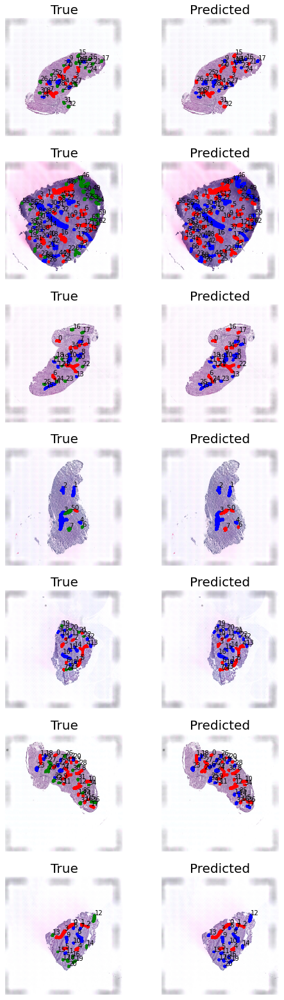

In [24]:
# instantiate plot
fig,ax = plt.subplots(len(data_set),2,
                      figsize = (4 * 2,4 * len(data_set)))

cmap = {"central":"red",
        "portal":"blue",
        "unknown":"green"}


for k,sample_id in enumerate(data_set.keys()):
  
    # convert predicted type to vector
    # with label for each pixel
    
    true_color = data_set[sample_id].uns["mask"].type.map(cmap).values.flatten()
    pred_color = data_set[sample_id].uns["mask"].type.map(cmap).values.flatten()
    
    idxs = data_set[sample_id].uns["mask"].id.values
    
    for idx in np.unique(idxs):
        sel = idxs == idx
        vein_id = sample_id + "_" + str(idx)
        pred_color[sel] = cmap[predict_all.loc[vein_id].values[0]]
        
    
    ut.plot_veins(ax[k,0],
                  data_set[sample_id],
                  alternative_colors = true_color,
                  show_image = True,
                  show_id = True,
                 )
    
    ut.plot_veins(ax[k,1],
                  data_set[sample_id],
                  alternative_colors = pred_color,
                  show_image = True,
                  show_id = True,
                 )
    
    # set titles
    ax[k,0].set_title("True",
                    fontsize = 20,)
    ax[k,1].set_title("Predicted",
                    fontsize = 20,)
    
    ax[k,0].set_ylabel(sample_id,
                       fontsize = 20)


if SAVE_RESULTS:
    fig.savefig(osp.join(RESULTS_DIR,"predict-all-hard.png"),
                facecolor = "white")
    
plt.show()